In [1]:
### 시작 및 본인정보 반영
# 반드시 이 cell을 실행하시오
# 실행하지 않을 시 직접 하지 않은 것으로 간주
# 마지막 줄 출력으로 파일명을 설정하고 제출 필수
import platform, psutil, os, datetime
print(platform.processor())
print(str(round(psutil.virtual_memory().total / (1024.0 **3)))+"(GB)")
print(platform.system())
print(platform.version())
print(os.getcwd())
print(datetime.datetime.fromtimestamp(os.path.getctime(os.getcwd())))
print(datetime.datetime.fromtimestamp(os.path.getmtime(os.getcwd())))
print(datetime.datetime.fromtimestamp(os.path.getatime(os.getcwd())))
print(datetime.datetime.now())
title = 'DL_RNNArchitectures'    # 고정값
name = '김경원'    # 본인 이름을 작성
studentid = '20211011'    # 본인 학번을 작성
# 아래 강좌 명 중 본인이 수강하는 강과명 작성
# 비즈니스데이터사이언스이해, 디지털비즈니스애널리틱스, 비즈니스수요예측, 인공지능기반의사결정, 빅데이터 등
# 비즈니스혁신을위한데이터사이언스응용, 인공지능활용디지털경제플랫폼연구 등
course = '비즈니스수요예측'    
print('다음 출력을 파일명으로 설정하고 제출하시오:', name + '_' + studentid + '_' + course + '_' + title)

Intel64 Family 6 Model 186 Stepping 2, GenuineIntel
32(GB)
Windows
10.0.26200
C:\DataScience\Lecture\[DataScience]
2024-12-12 00:34:16.155373
2025-11-13 15:08:50.214384
2025-11-13 15:08:50.214384
2025-11-13 15:08:57.318914
다음 출력을 파일명으로 설정하고 제출하시오: 김경원_20211011_비즈니스수요예측_DL_RNNArchitectures


# **Import Library:** 분석에 사용할 모듈 설치

[![Open in Colab](http://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/thekimk/All-About-Deep-Learning/blob/main/Practice4-3_DeepLearning_RNNArchitectures_KK.ipynb)

In [1]:
# !pip install --upgrade pip
# !python -m pip install --user --upgrade pip

In [2]:
# # Tensorflow 및 Keras 설치하기
# !pip install tensorflow==2.10.*
# # !pip install --upgrade --user tensorflow
# !pip install -U tensorflow-addons
# !pip install keras
# # !pip install --upgrade --user keras
# !pip install keras-tqdm

In [3]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Data manipulation and visualization
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_rows = 20
pd.options.display.max_columns = 20
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing

# Modeling algorithms
# General
import statsmodels.api as sm
from scipy import stats
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.get_logger().warning('test')
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras import layers, regularizers, callbacks
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Input, Dense, Activation, Flatten, Dropout, Reshape
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Conv2D, MaxPooling2D
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import SimpleRNN, Bidirectional, LSTM, GRU
from tensorflow.python.keras.utils import np_utils
from tensorflow.keras.utils import plot_model

# Model selection
from sklearn.model_selection import train_test_split, GridSearchCV

# Evaluation metrics
from sklearn import metrics
# for regression
from sklearn.metrics import mean_squared_error,  mean_absolute_error, mean_absolute_percentage_error
# for classification
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.metrics import roc_curve, auc, precision_recall_curve

In [4]:
# 사용자 정의 함수
from module_regression import *
from module_classification import *

# **Problem:** 자전거공유수요 예측

## Data Preprocessing

<center><img src='Image/Expert/Data_BikeSharingDemand.PNG' width='800'></center>

| **변수** 	| **설명** 	|
|:---:	|:---:	|
| **datetime** 	| 날짜시간정보 	|
| **season** 	| 계절 	|
| **holiday** 	| 휴일여부 	|
| **workingday** 	| 주중/주말 	|
| **weather** 	| 날씨 	|
| **temp** 	| 온도 	|
| **atemp** 	| 체감 온도 	|
| **humidity** 	| 습도 	|
| **windspeed** 	| 풍속도 	|
| **casual** 	| 비회원 대여수량 	|
| **registered** 	| 회원 대여수량 	|
| **count** 	| 총 대여수량 	|

In [5]:
# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

In [6]:
# df의 정보 확인
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    17379 non-null  object 
 1   season      17379 non-null  int64  
 2   holiday     17379 non-null  int64  
 3   workingday  17379 non-null  int64  
 4   weather     17379 non-null  int64  
 5   temp        17379 non-null  float64
 6   atemp       17379 non-null  float64
 7   humidity    17379 non-null  int64  
 8   windspeed   17379 non-null  float64
 9   casual      17379 non-null  int64  
 10  registered  17379 non-null  int64  
 11  count       17379 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1.6+ MB


In [7]:
# 시간정보가 문자로 인식되는 경우 datetime 형식으로 변환하기
if 'datetime' in df.columns:
    df['DateTime'] = pd.to_datetime(df['datetime'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    17379 non-null  object        
 1   season      17379 non-null  int64         
 2   holiday     17379 non-null  int64         
 3   workingday  17379 non-null  int64         
 4   weather     17379 non-null  int64         
 5   temp        17379 non-null  float64       
 6   atemp       17379 non-null  float64       
 7   humidity    17379 non-null  int64         
 8   windspeed   17379 non-null  float64       
 9   casual      17379 non-null  int64         
 10  registered  17379 non-null  int64         
 11  count       17379 non-null  int64         
 12  DateTime    17379 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(3), int64(8), object(1)
memory usage: 1.7+ MB


In [8]:
# 현재 df의 index확인
df.index

RangeIndex(start=0, stop=17379, step=1)

In [9]:
# 현재 df의 index 형태확인
df.index.dtype

dtype('int64')

In [10]:
# df의 index를 시간정보로 변경하기
if df.index.dtype == 'int64':
    df.set_index('DateTime', inplace=True)
df
# df의 index를 원래대로 복원하기
# if df.index.dtype != 'int64':
#     df.reset_index(drop=False, inplace=True)
# df

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
DateTime,,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 0:00,1,0,0,1,9.84,14.39,81,0.00,3,13,16
2011-01-01 01:00:00,2011-01-01 1:00,1,0,0,1,9.02,13.63,80,0.00,8,32,40
2011-01-01 02:00:00,2011-01-01 2:00,1,0,0,1,9.02,13.63,80,0.00,5,27,32
2011-01-01 03:00:00,2011-01-01 3:00,1,0,0,1,9.84,14.39,75,0.00,3,10,13
2011-01-01 04:00:00,2011-01-01 4:00,1,0,0,1,9.84,14.39,75,0.00,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00,1,0,1,2,10.66,12.88,60,11.00,11,108,119
2012-12-31 20:00:00,2012-12-31 20:00,1,0,1,2,10.66,12.88,60,11.00,8,81,89
2012-12-31 21:00:00,2012-12-31 21:00,1,0,1,1,10.66,12.88,60,11.00,7,83,90


In [11]:
# 데이터 변경사항 확인
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
datetime,17379,17379,2011-01-01 0:00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
season,"17,379.00",NaN,NaN,NaN,2.50,1.11,1.00,2.00,3.00,3.00,4.00
holiday,"17,379.00",NaN,NaN,NaN,0.03,0.17,0.00,0.00,0.00,0.00,1.00
workingday,"17,379.00",NaN,NaN,NaN,0.68,0.47,0.00,0.00,1.00,1.00,1.00
weather,"17,379.00",NaN,NaN,NaN,1.43,0.64,1.00,1.00,1.00,2.00,4.00
temp,"17,379.00",NaN,NaN,NaN,20.38,7.89,0.82,13.94,20.50,27.06,41.00
atemp,"17,379.00",NaN,NaN,NaN,23.79,8.59,0.00,16.66,24.24,31.06,50.00
humidity,"17,379.00",NaN,NaN,NaN,62.72,19.29,0.00,48.00,63.00,78.00,100.00
windspeed,"17,379.00",NaN,NaN,NaN,12.74,8.20,0.00,7.00,13.00,17.00,57.00
casual,"17,379.00",NaN,NaN,NaN,35.68,49.31,0.00,4.00,17.00,48.00,367.00


In [12]:
# df의 index가 시간정보로 반영되어 있는지 확인
# 하지만 컴퓨터는 빈도는 모르겠다고 함
df.index

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 01:00:00',
               '2011-01-01 02:00:00', '2011-01-01 03:00:00',
               '2011-01-01 04:00:00', '2011-01-01 05:00:00',
               '2011-01-01 06:00:00', '2011-01-01 07:00:00',
               '2011-01-01 08:00:00', '2011-01-01 09:00:00',
               ...
               '2012-12-31 14:00:00', '2012-12-31 15:00:00',
               '2012-12-31 16:00:00', '2012-12-31 17:00:00',
               '2012-12-31 18:00:00', '2012-12-31 19:00:00',
               '2012-12-31 20:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=17379, freq=None)

In [13]:
# 우리가 설정한 시간정보가 어떤 시간 단위인지 빈도를 설정후 index 재확인
df.asfreq('H').index

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 01:00:00',
               '2011-01-01 02:00:00', '2011-01-01 03:00:00',
               '2011-01-01 04:00:00', '2011-01-01 05:00:00',
               '2011-01-01 06:00:00', '2011-01-01 07:00:00',
               '2011-01-01 08:00:00', '2011-01-01 09:00:00',
               ...
               '2012-12-31 14:00:00', '2012-12-31 15:00:00',
               '2012-12-31 16:00:00', '2012-12-31 17:00:00',
               '2012-12-31 18:00:00', '2012-12-31 19:00:00',
               '2012-12-31 20:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=17544, freq='H')

In [14]:
# 데이터 결측치 확인
# 실제 현실 시간 공간에서 존재했어야 하는 시간값이 없을 경우 NaN으로 일단 채움
df.asfreq('H').isnull().sum()

datetime      165
season        165
holiday       165
workingday    165
weather       165
temp          165
atemp         165
humidity      165
windspeed     165
casual        165
registered    165
count         165
dtype: int64

In [15]:
# 결측치가 존재하는 시간값과 데이터 확인
df.asfreq('H')[df.asfreq('H').isnull().sum(axis=1) > 0]

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
DateTime,,,,,,,,,,,,
2011-01-02 05:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-03 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-03 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-04 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-05 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2012-10-30 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-11-08 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-11-29 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# 시간정보의 빈도를 설정하면 자유롭게 다양한 시간축의 DataBase 변경이 용이
df.asfreq('D')
df.asfreq('W')
df.asfreq('H')
df.asfreq('H').isnull().sum()
df.asfreq('H')[df.asfreq('H').isnull().sum(axis=1) > 0]
df.asfreq('H').head(100)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
DateTime,,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 0:00,1.00,0.00,0.00,1.00,9.84,14.39,81.00,0.00,3.00,13.00,16.00
2011-01-01 01:00:00,2011-01-01 1:00,1.00,0.00,0.00,1.00,9.02,13.63,80.00,0.00,8.00,32.00,40.00
2011-01-01 02:00:00,2011-01-01 2:00,1.00,0.00,0.00,1.00,9.02,13.63,80.00,0.00,5.00,27.00,32.00
2011-01-01 03:00:00,2011-01-01 3:00,1.00,0.00,0.00,1.00,9.84,14.39,75.00,0.00,3.00,10.00,13.00
2011-01-01 04:00:00,2011-01-01 4:00,1.00,0.00,0.00,1.00,9.84,14.39,75.00,0.00,0.00,1.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...
2011-01-04 23:00:00,2011-01-04 23:00,1.00,0.00,1.00,1.00,8.20,11.37,69.00,6.00,2.00,9.00,11.00
2011-01-05 00:00:00,2011-01-05 0:00,1.00,0.00,1.00,1.00,8.20,12.88,64.00,0.00,0.00,6.00,6.00
2011-01-05 01:00:00,2011-01-05 1:00,1.00,0.00,1.00,1.00,6.56,9.85,74.00,6.00,0.00,6.00,6.00


In [17]:
# 최종적으로 데이터의 시간정보 빈도를 결정하고 NaN 값을 채운 후 결측치 확인
df = df.asfreq('H', method='ffill')
df.isnull().sum()

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
count         0
dtype: int64

In [18]:
# 시계열 데이터는 날짜 기준으로 train < test
# index가 날짜로 그리고 빈도가 제대로 반영되어 있는지 확인
df.index

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 01:00:00',
               '2011-01-01 02:00:00', '2011-01-01 03:00:00',
               '2011-01-01 04:00:00', '2011-01-01 05:00:00',
               '2011-01-01 06:00:00', '2011-01-01 07:00:00',
               '2011-01-01 08:00:00', '2011-01-01 09:00:00',
               ...
               '2012-12-31 14:00:00', '2012-12-31 15:00:00',
               '2012-12-31 16:00:00', '2012-12-31 17:00:00',
               '2012-12-31 18:00:00', '2012-12-31 19:00:00',
               '2012-12-31 20:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=17544, freq='H')

In [19]:
# 날짜 index의 경우 쉽게 특정 시점으로 구분 가능
df.index < '2012'

array([ True,  True,  True, ..., False, False, False])

In [20]:
# 날짜 index의 경우 쉽게 특정 시점으로 구분 가능
# Train & Test 분할
df_train = df.loc[df.index < '2012-07-01',:]
df_test = df.loc[df.index >= '2012-07-01',:]
print(df_train.shape, df_test.shape)

(13128, 12) (4416, 12)


In [21]:
# 종속변수와 독립변수 결정
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in df.columns if x not in Y_colname+X_remove]
len(X_colname)

8

In [22]:
# X_train, Y_train, X_test, Y_test 분할
Y_train = df_train[Y_colname]
X_train = df_train[X_colname]
Y_test = df_test[Y_colname]
X_test = df_test[X_colname]

In [23]:
# 데이터의 갯수와 크기 확인
print('---------------train----------------')
print('X: ', X_train.shape)
print('Y: ', Y_train.shape)
display(X_train.describe().T)
print('----------------test----------------')
print('X: ', X_test.shape)
print('Y: ', Y_test.shape)
display(X_test.describe().T)

---------------train----------------
X:  (13128, 8)
Y:  (13128, 1)


,count,mean,std,min,25%,50%,75%,max
season,"13,128.00",2.20,1.05,1.00,1.00,2.00,3.00,4.00
holiday,"13,128.00",0.03,0.17,0.00,0.00,0.00,0.00,1.00
workingday,"13,128.00",0.68,0.46,0.00,0.00,1.00,1.00,1.00
weather,"13,128.00",1.43,0.66,1.00,1.00,1.00,2.00,4.00
temp,"13,128.00",19.66,7.87,0.82,13.12,19.68,26.24,40.18
atemp,"13,128.00",23.04,8.61,0.00,15.91,23.48,30.30,50.00
humidity,"13,128.00",62.48,20.01,0.00,47.00,62.00,79.00,100.00
windspeed,"13,128.00",13.21,8.44,0.00,7.00,13.00,19.00,57.00


----------------test----------------
X:  (4416, 8)
Y:  (4416, 1)


,count,mean,std,min,25%,50%,75%,max
season,"4,416.00",3.36,0.77,1.00,3.00,3.00,4.00,4.00
holiday,"4,416.00",0.03,0.18,0.00,0.00,0.00,0.00,1.00
workingday,"4,416.00",0.68,0.47,0.00,0.00,1.00,1.00,1.00
weather,"4,416.00",1.44,0.63,1.00,1.00,1.00,2.00,3.00
temp,"4,416.00",22.20,7.74,5.74,14.76,22.96,28.70,41.00
atemp,"4,416.00",25.70,8.37,7.58,18.18,26.52,32.58,45.45
humidity,"4,416.00",64.03,17.12,16.00,50.00,65.00,78.00,100.00
windspeed,"4,416.00",11.64,7.74,0.00,7.00,11.00,17.00,44.00


In [24]:
# 데이터 스케일링
scaler = preprocessing.MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
print('---------------train----------------')
print('normalized X: ', X_train.shape, X_train.min(), X_train.max())
print('----------------test----------------')
print('normalized X: ', X_test.shape, X_test.min(), X_test.max())

---------------train----------------
normalized X:  (13128, 8) 0.0 1.0
----------------test----------------
normalized X:  (4416, 8) 0.0 1.0208333333333335


In [25]:
# 데이터 전처리 함수화
def preprocessing_BikeSharing(df):
    # 시간정보가 문자로 인식되는 경우 datetime 형식으로 변환하기
    if 'datetime' in df.columns:
        df['DateTime'] = pd.to_datetime(df['datetime'])

    # df의 index를 시간정보로 변경하기
    if df.index.dtype == 'int64':
        df.set_index('DateTime', inplace=True)

    # 최종적으로 데이터의 시간정보 빈도를 결정하고 NaN 값을 채운 후
    df = df.asfreq('H', method='ffill')

    # 종속변수와 독립변수 결정
    Y_colname = ['count']
    X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
    X_colname = [x for x in df.columns if x not in Y_colname+X_remove]

    # Train & Test 분할
#     df_train = df.loc[df.index < '2012-07-01',:]
#     df_test = df.loc[df.index >= '2012-07-01',:]
    df_train = df.loc[df.index >= '2012-01-01',:]
    df_train = df_train.loc[df_train.index < '2012-10-01',:]
    df_test = df.loc[df.index >= '2012-10-01',:]

    # X_train, Y_train, X_test, Y_test 분할
    Y_train = df_train[Y_colname]
    X_train = df_train[X_colname]
    Y_test = df_test[Y_colname]
    X_test = df_test[X_colname]

    # 데이터 스케일링
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    print('---------------train----------------')
    print('normalized X: ', X_train.shape, X_train.min(), X_train.max())
    print('----------------test----------------')
    print('normalized X: ', X_test.shape, X_test.min(), X_test.max())
    
    return X_train, X_test, Y_train, Y_test

# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0


In [7]:
# 데이터 전처리 함수화
def preprocessing_BikeSharing(df):
    # 시간정보가 문자로 인식되는 경우 datetime 형식으로 변환하기
    if 'datetime' in df.columns:
        df['DateTime'] = pd.to_datetime(df['datetime'])

    # df의 index를 시간정보로 변경하기
    if df.index.dtype == 'int64':
        df.set_index('DateTime', inplace=True)

    # 최종적으로 데이터의 시간정보 빈도를 결정하고 NaN 값을 채운 후
    df = df.asfreq('H', method='ffill')

    # 종속변수와 독립변수 결정
    Y_colname = ['count']
    X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
    X_colname = [x for x in df.columns if x not in Y_colname+X_remove]

    # Train & Test 분할 (효율적 강의을 위한 연산시간 단축을 위해 train/test 길이를 줄임)
#     df_train = df.loc[df.index < '2012-07-01',:]
#     df_test = df.loc[df.index >= '2012-07-01',:]
    df_train = df.loc[df.index >= '2012-01-01',:]
    df_train = df_train.loc[df_train.index < '2012-10-01',:]
    df_test = df.loc[df.index >= '2012-10-01',:]

    # X_train, Y_train, X_test, Y_test 분할
    Y_train = df_train[Y_colname]
    X_train = df_train[X_colname]
    Y_test = df_test[Y_colname]
    X_test = df_test[X_colname]

    # 데이터 스케일링
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    print('---------------train----------------')
    print('normalized X: ', X_train.shape, X_train.min(), X_train.max())
    print('----------------test----------------')
    print('normalized X: ', X_test.shape, X_test.min(), X_test.max())
    
    return X_train, X_test, Y_train, Y_test

# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0


In [26]:
# 데이터 백업
X_trprep2D, X_teprep2D = X_train.copy(), X_test.copy()
Y_trprep2D, Y_teprep2D = Y_train.copy(), Y_test.copy()

## MLP

<center><img src='Image/Expert/DL_MLP_Custom.PNG' width='500'></center>

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 8)]               0         
                                                                 
 dense (Dense)               (None, 128)               1152      
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 32)              

Training:   0%|                                                                                               …

Epoch 24: early stopping


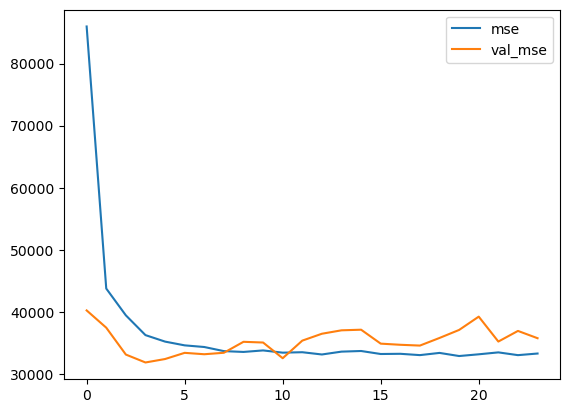

69/69 [==============================] - 0s 1ms/step


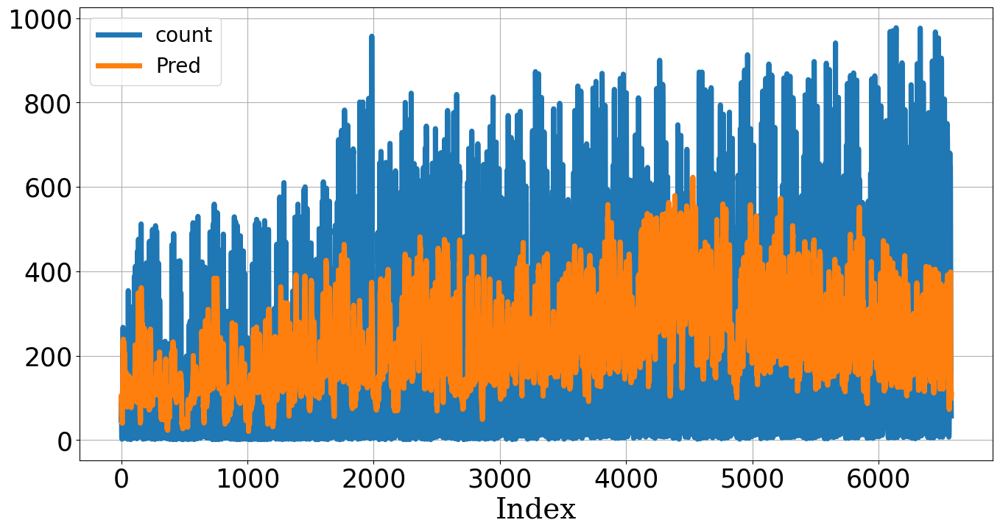

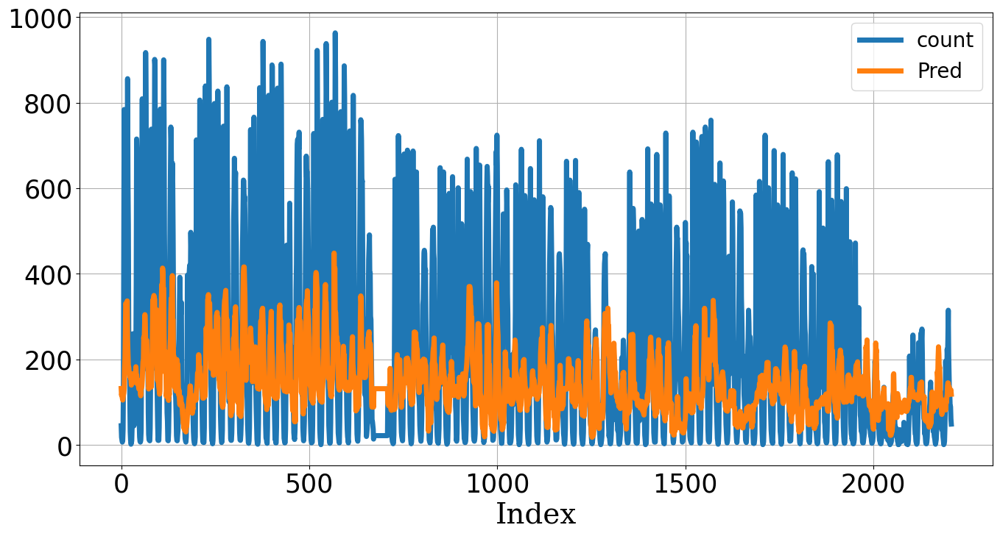

,MAE,MSE,MAPE
Train,134.99,"30,862.48",4.93
Test,131.12,"35,738.67",3.29


In [27]:
# 하이퍼파라미터
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 20
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BikeSharing_MLP.h5')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', 
                                    patience=EARLYSTOP_PATIENT, verbose=1),
            tfa.callbacks.TQDMProgressBar(show_epoch_progress=False),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

69/69 [==============================] - 0s 1ms/step


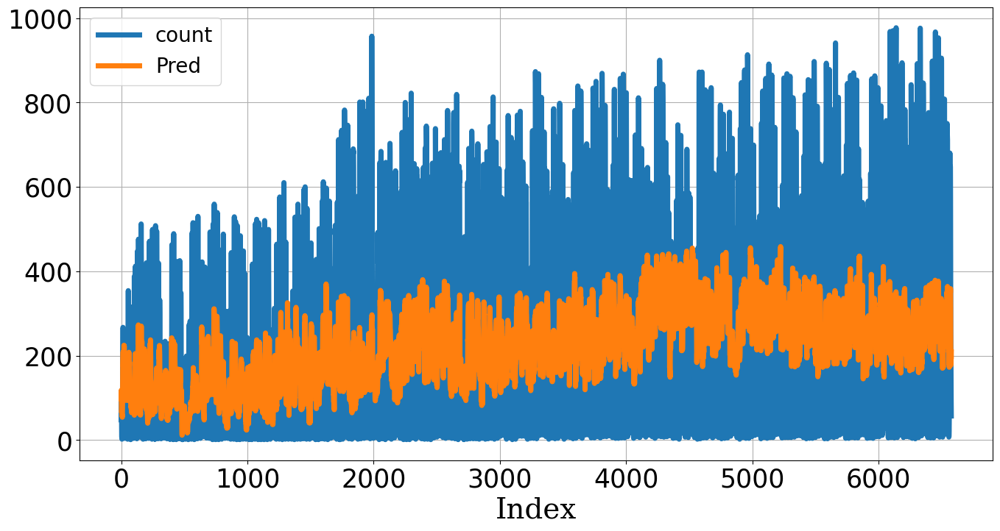

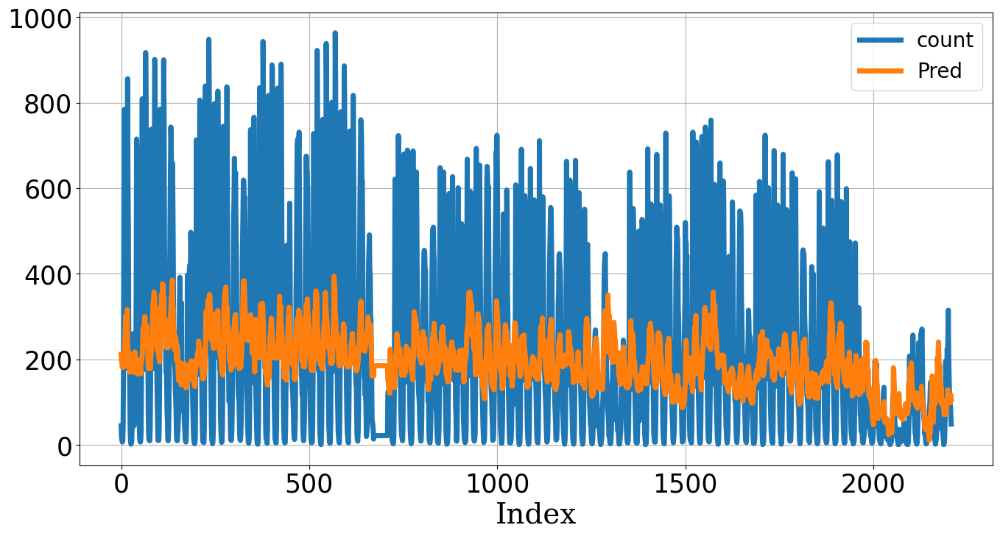

,MAE,MSE,MAPE
Train,140.21,"33,614.91",5.14
Test,132.63,"31,826.84",4.86


In [28]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## CNN

<center><img src='Image/Expert/CNN_Example.webp' width='900'></center>

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0
X_train: (6576, 8, 1) Y_train: (6576, 1)
X_test: (2208, 8, 1) Y_test: (2208, 1)
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 8, 1)]            0         
                                                                 
 conv1d (Conv1D)             (None, 8, 128)            512       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 4, 128)           0         
 )                                                               
                                                                 
 dropout_3 (Dropout)         (None, 4, 128)            0         
                                                                 
 conv1d_1 (Conv1D)           (None, 4

Training:   0%|                                                                                               …

Epoch 66: early stopping


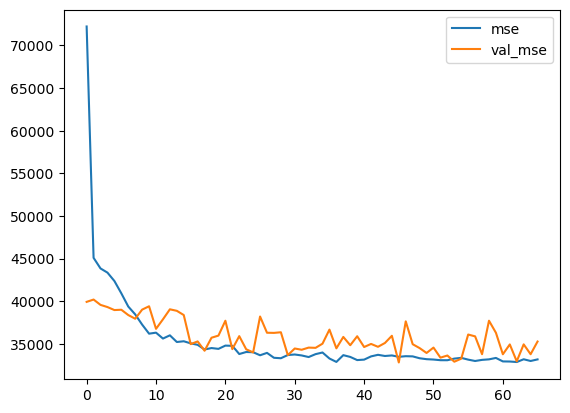

69/69 [==============================] - 0s 1ms/step


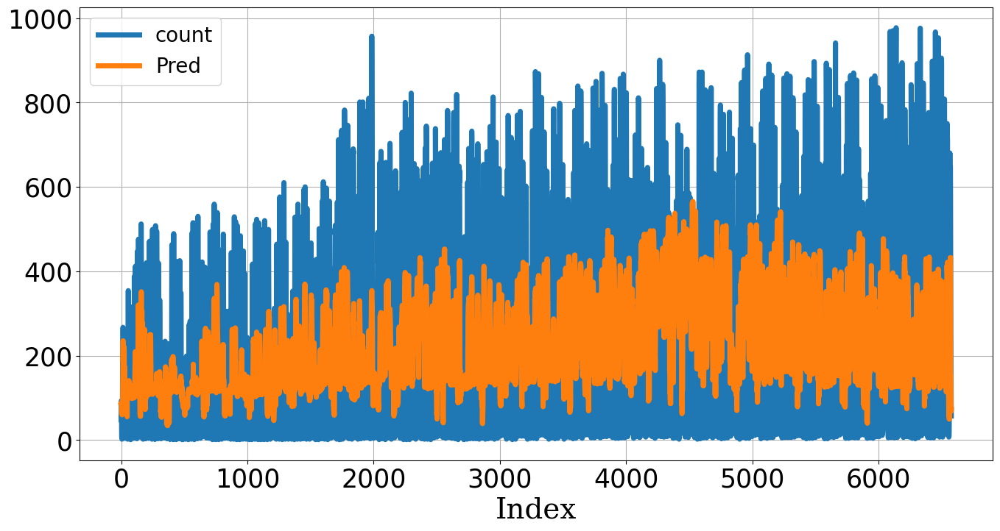

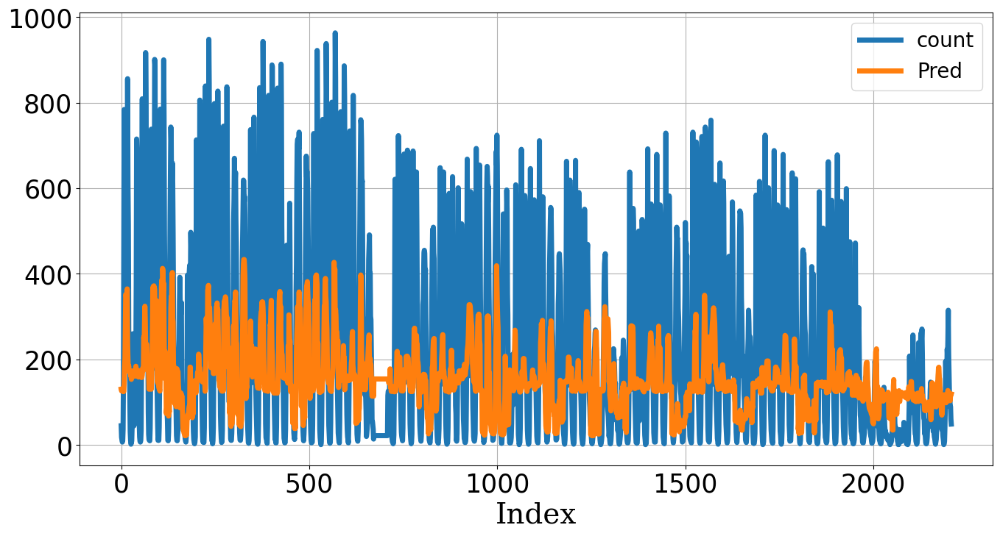

,MAE,MSE,MAPE
Train,132.45,"30,525.35",4.79
Test,133.33,"35,284.48",3.90


In [29]:
# 하이퍼파라미터
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 20
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BikeSharing_CNN.h5')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', 
                                    patience=EARLYSTOP_PATIENT, verbose=1),
            tfa.callbacks.TQDMProgressBar(show_epoch_progress=False),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

# Reshape
X_train = X_train.reshape(-1, X_train.shape[1], 1)
X_test = X_test.reshape(-1, X_test.shape[1], 1)
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))   
hiddens = Conv1D(128, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(inputs)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Conv1D(64, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION)(hiddens)  
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

69/69 [==============================] - 0s 1ms/step


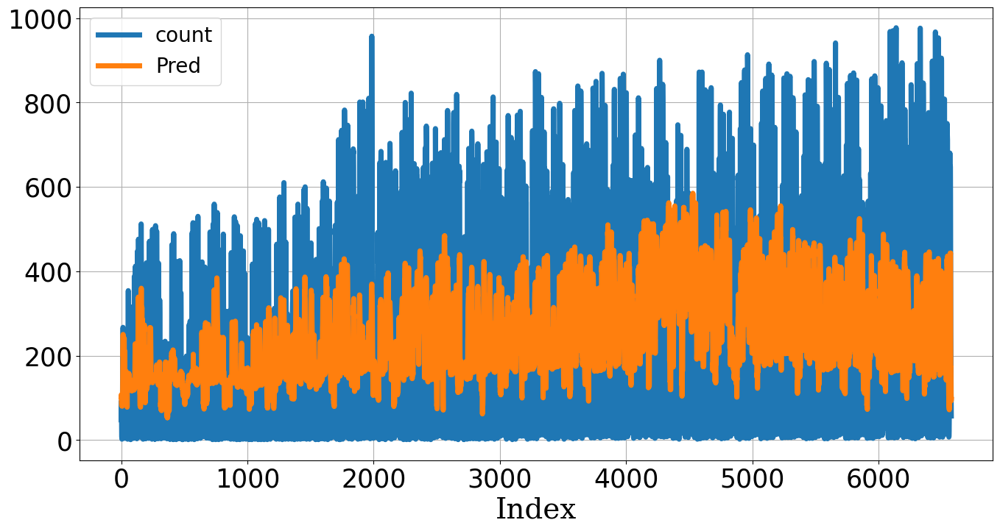

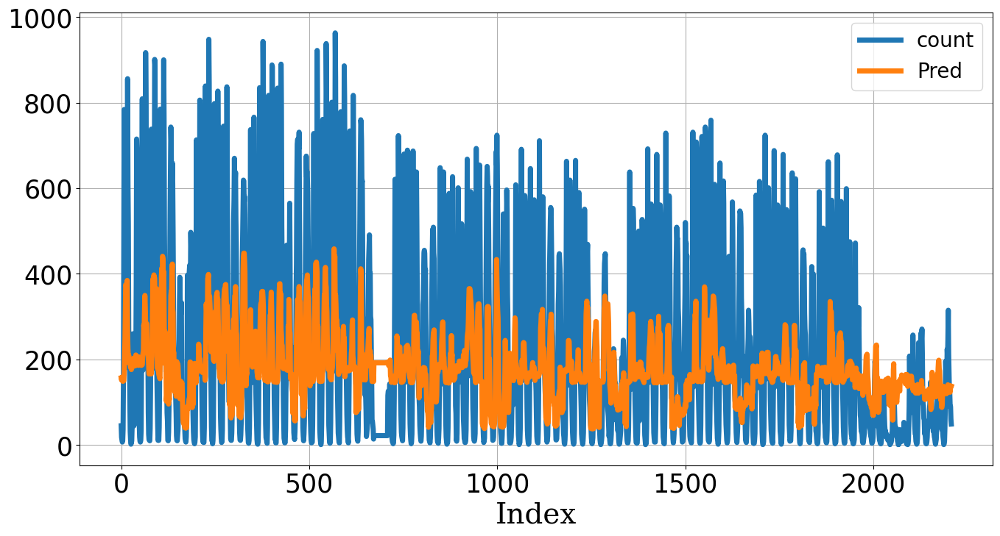

,MAE,MSE,MAPE
Train,138.46,"30,812.01",5.66
Test,132.68,"32,828.46",4.67


In [30]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Data Reshaping

- **종속변수 Y와 독립변수 X의 전처리 필요!**

<center><img src='Image/Expert/Reshape_2Dto3DSeq.png' width='1100'></center>

In [31]:
# sequence 데이터 추출 및 변환
seq_length = 12


print('origin X: ', X_train.shape, '-> reshape X: ', X_reshape.shape)
print('origin Y: ', Y_train.shape, '-> reshape Y: ', Y_reshape.shape)

origin X:  (6576, 8, 1) -> reshape X:  (6565, 12, 8, 1)
origin Y:  (6576, 1) -> reshape Y:  (6565, 1)


In [32]:
# reshape 함수화
def reshape_2Dto3Dseq(df_X, df_Y, seq_length):
    # generate sequence
    X_reshape, Y_reshape = [], []
    for index in range(len(df_X) - seq_length + 1):
        X_reshape.append(np.array(df_X[index: index + seq_length]))    # sequence 길이의 row 선택후 붙이기
        Y_reshape.append(np.ravel(df_Y[index + seq_length - 1:index + seq_length]))    # sequence 길이를 제외하고 1개씩 붙이기
    
    # arrange
    X_reshape, Y_reshape = np.array(X_reshape), np.array(Y_reshape)
    Y_reshape = pd.DataFrame(Y_reshape, index=df_Y.index[seq_length-1:], columns=df_Y.columns)
    
    print('origin X: ', df_X.shape, '-> reshape X: ', X_reshape.shape)
    print('origin Y: ', df_Y.shape, '-> reshape Y: ', Y_reshape.shape)
    
    return X_reshape, Y_reshape

SEQUENCE=12
X, Y = reshape_2Dto3Dseq(X_train, Y_train, seq_length=SEQUENCE)

origin X:  (6576, 8, 1) -> reshape X:  (6565, 12, 8, 1)
origin Y:  (6576, 1) -> reshape Y:  (6565, 1)


In [33]:
# train & test 형태 변경


print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

origin X:  (8784, 8, 1) -> reshape X:  (8773, 12, 8, 1)
origin Y:  (8784, 1) -> reshape Y:  (8773, 1)
X_train: (6565, 12, 8, 1) Y_train: (6565, 1)
X_test: (2208, 12, 8, 1) Y_test: (2208, 1)


In [34]:
# 데이터 백업
X_trprep3D, X_teprep3D = X_train.copy(), X_test.copy()
Y_trprep3D, Y_teprep3D = Y_train.copy(), Y_test.copy()

## RNN

<center><img src='Image/Expert/DL_RNN_UnfoldFold.PNG' width='600'></center>

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0
origin X:  (8784, 8) -> reshape X:  (8773, 12, 8)
origin Y:  (8784, 1) -> reshape Y:  (8773, 1)
X_train: (6565, 12, 8) Y_train: (6565, 1)
X_test: (2208, 12, 8) Y_test: (2208, 1)
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 12, 8)]           0         
                                                                 
 simple_rnn (SimpleRNN)      (None, 12, 128)           17536     
                                                                 
 dropout_6 (Dropout)         (None, 12, 128)           0         
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 12, 64)            12352     
                                                                 
 drop

Training:   0%|                                                                                               …

Epoch 32: early stopping


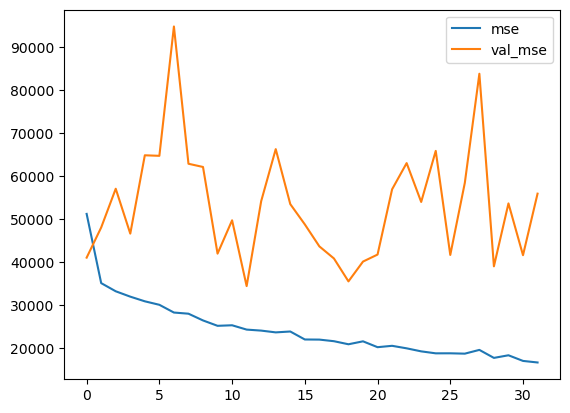

69/69 [==============================] - 0s 4ms/step


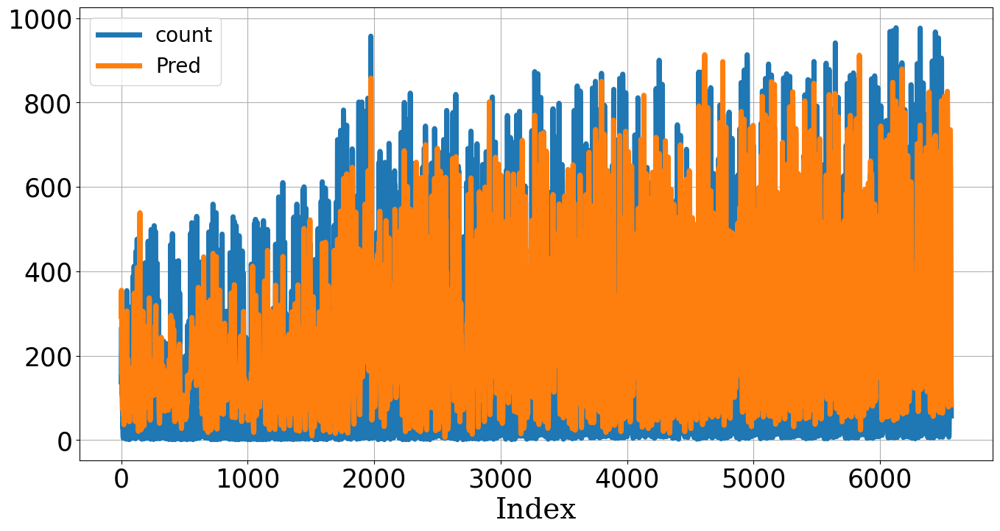

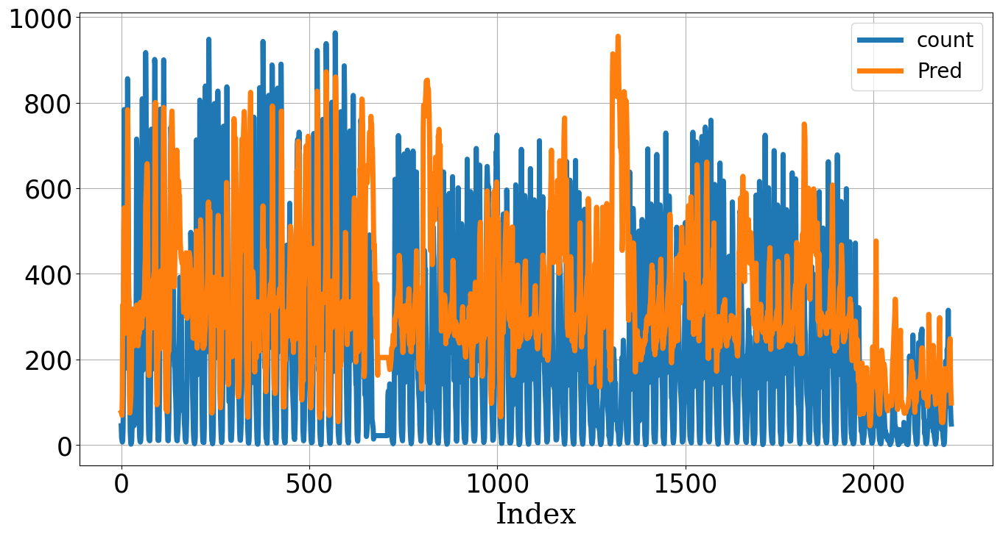

,MAE,MSE,MAPE
Train,91.73,"15,980.23",3.27
Test,180.15,"55,915.45",8.49


In [35]:
# 하이퍼파라미터


# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

# Reshape


# 네트워크 구축


## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

69/69 [==============================] - 0s 4ms/step


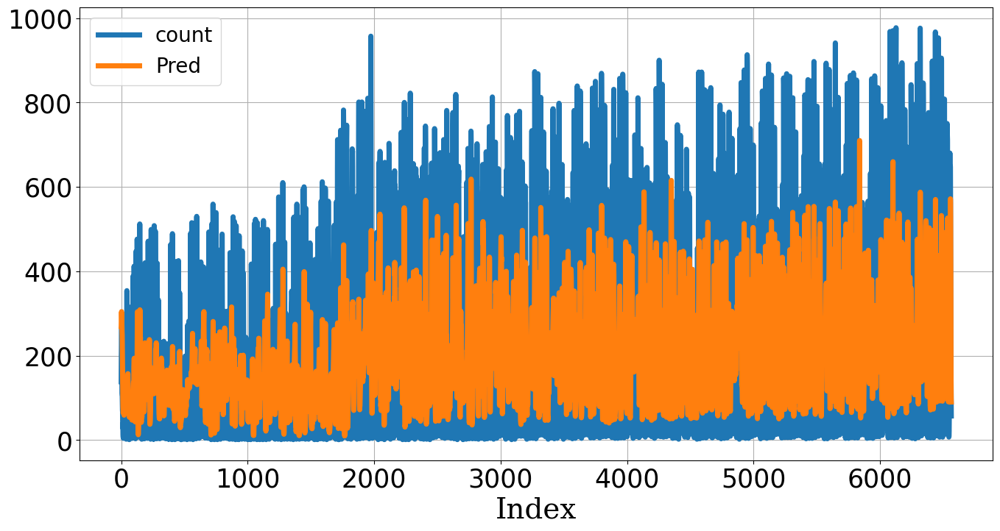

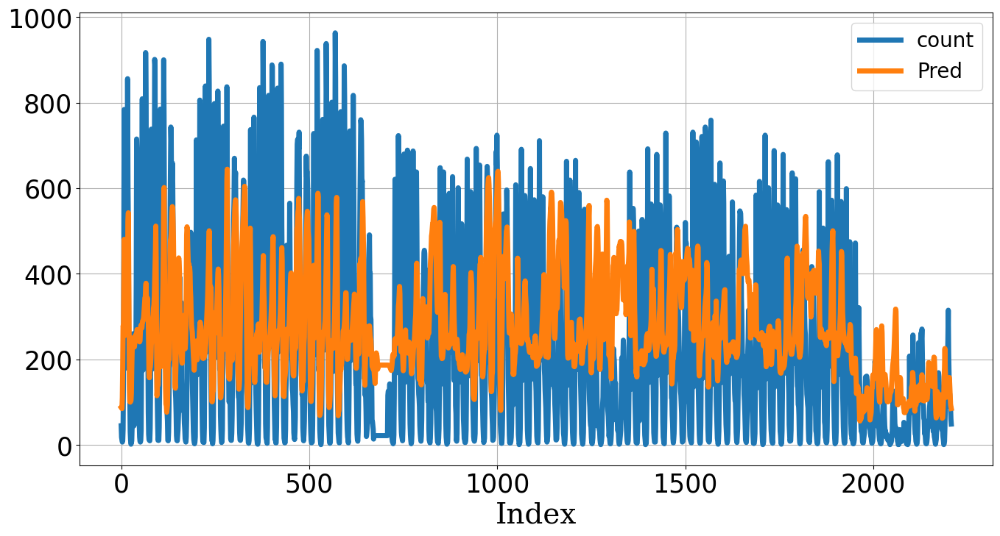

,MAE,MSE,MAPE
Train,112.16,"25,097.27",3.19
Test,146.42,"34,425.87",6.67


In [36]:
# 베스트 모델 로딩


## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## LSTM

<center><img src='Image/Expert/DL_RNN_Operation.PNG' width='700'>(http://colah.github.io/posts/2015-08-Understanding-LSTMs/)</center>

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0
origin X:  (8784, 8) -> reshape X:  (8773, 12, 8)
origin Y:  (8784, 1) -> reshape Y:  (8773, 1)
X_train: (6565, 12, 8) Y_train: (6565, 1)
X_test: (2208, 12, 8) Y_test: (2208, 1)
Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 12, 8)]           0         
                                                                 
 lstm (LSTM)                 (None, 12, 128)           70144     
                                                                 
 dropout_8 (Dropout)         (None, 12, 128)           0         
                                                                 
 lstm_1 (LSTM)               (None, 12, 64)            49408     
                                                                 
 drop

Training:   0%|                                                                                               …

Epoch 32: early stopping


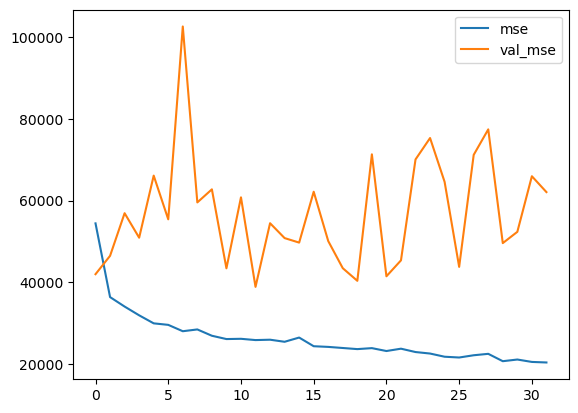

69/69 [==============================] - 1s 8ms/step


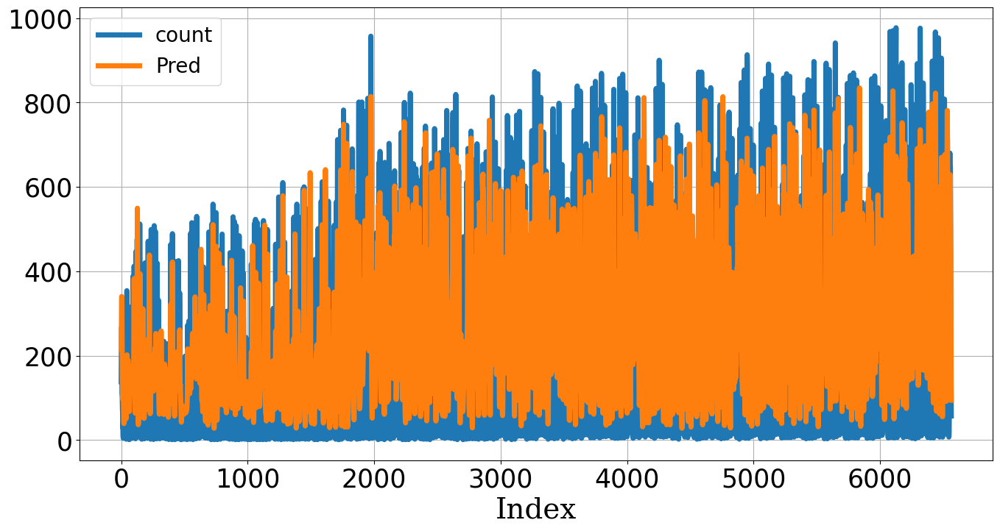

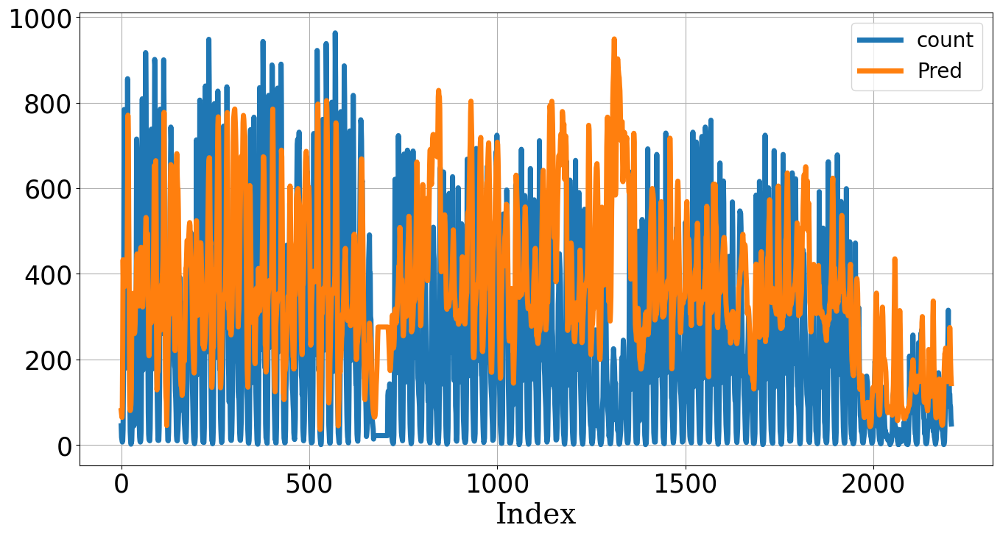

,MAE,MSE,MAPE
Train,101.97,"19,028.77",3.62
Test,198.83,"62,075.89",8.99


In [37]:
# 하이퍼파라미터


# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

# Reshape


# 네트워크 구축


## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

69/69 [==============================] - 1s 8ms/step


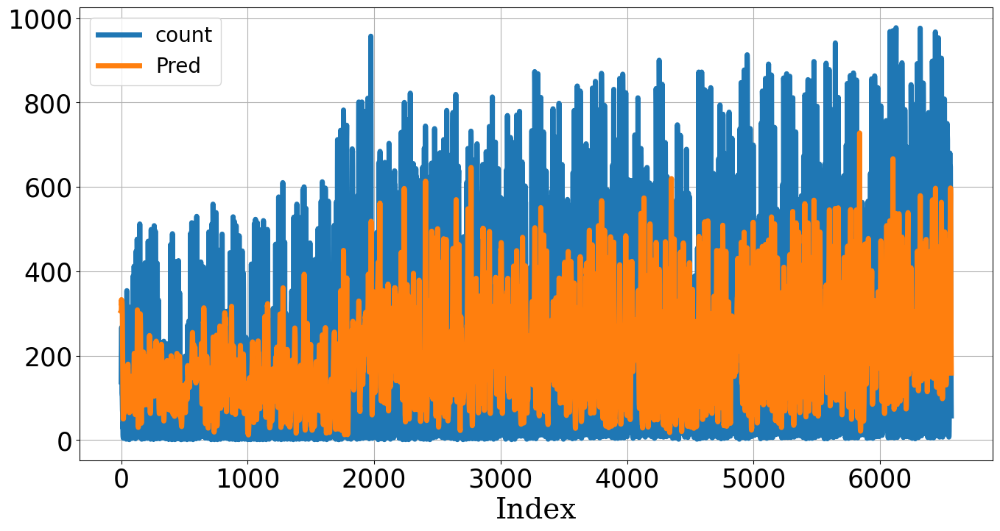

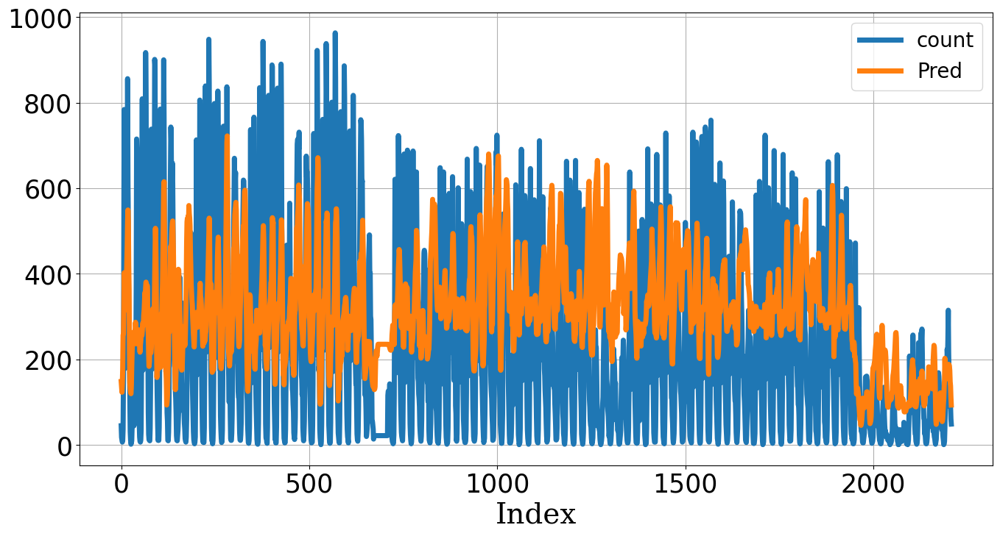

,MAE,MSE,MAPE
Train,116.12,"26,231.22",3.37
Test,163.76,"38,897.11",7.61


In [38]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## GRU

<center><img src='Image/Expert/DL_LSTM_GRU.png' width='700'>(https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21)</center>

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0
origin X:  (8784, 8) -> reshape X:  (8773, 12, 8)
origin Y:  (8784, 1) -> reshape Y:  (8773, 1)
X_train: (6565, 12, 8) Y_train: (6565, 1)
X_test: (2208, 12, 8) Y_test: (2208, 1)
Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 12, 8)]           0         
                                                                 
 gru (GRU)                   (None, 12, 128)           52992     
                                                                 
 dropout_10 (Dropout)        (None, 12, 128)           0         
                                                                 
 gru_1 (GRU)                 (None, 12, 64)            37248     
                                                                 
 drop

Training:   0%|                                                                                               …

Epoch 83: early stopping


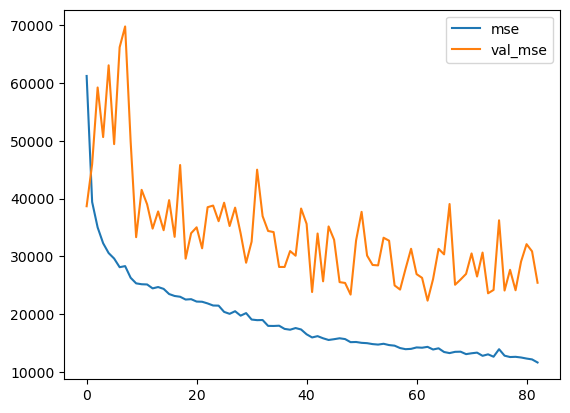

69/69 [==============================] - 1s 10ms/step


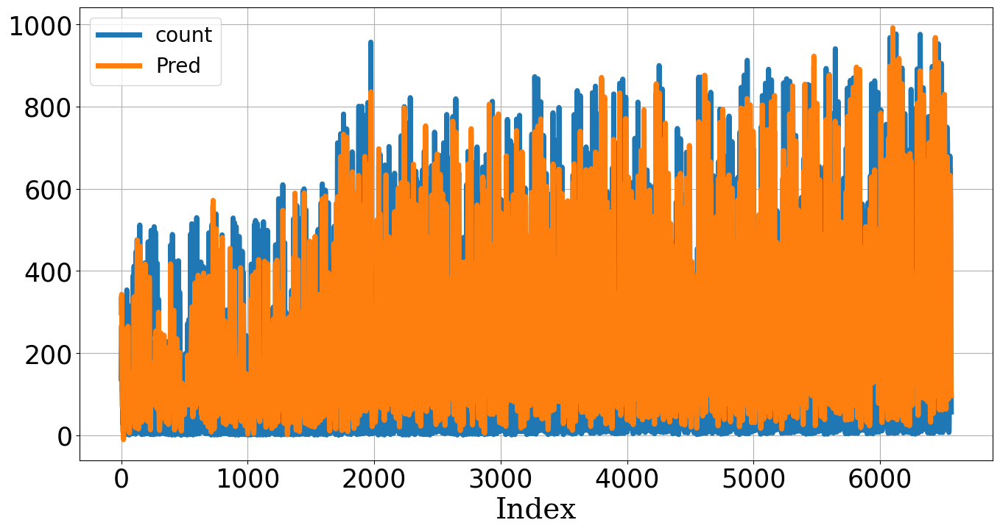

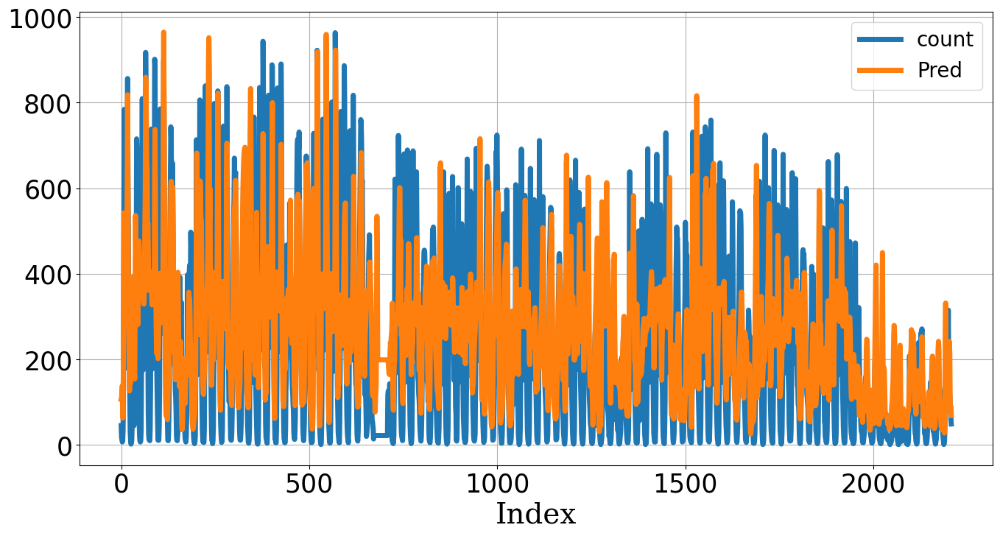

,MAE,MSE,MAPE
Train,73.27,"11,453.95",2.35
Test,121.53,"25,428.56",5.57


In [39]:
# 하이퍼파라미터


# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

# Reshape


# 네트워크 구축


## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

69/69 [==============================] - 1s 10ms/step


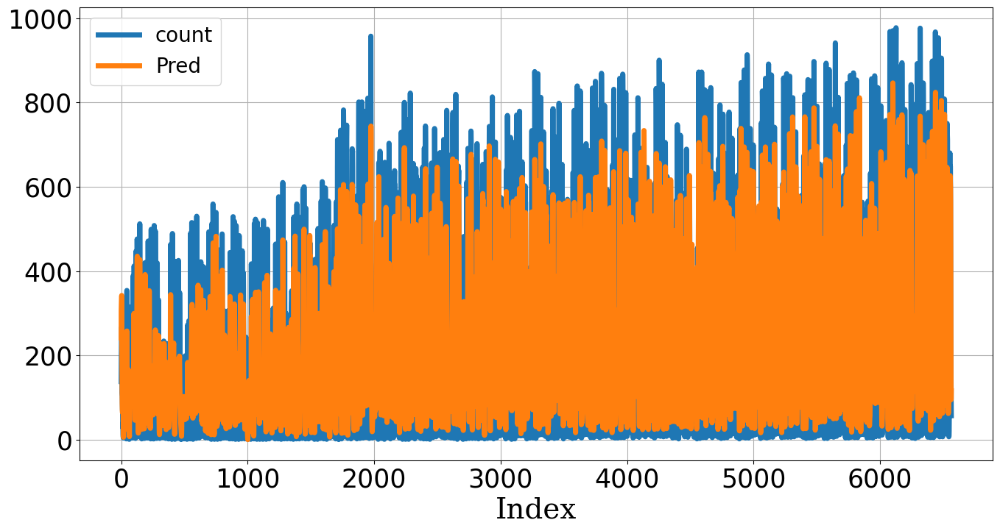

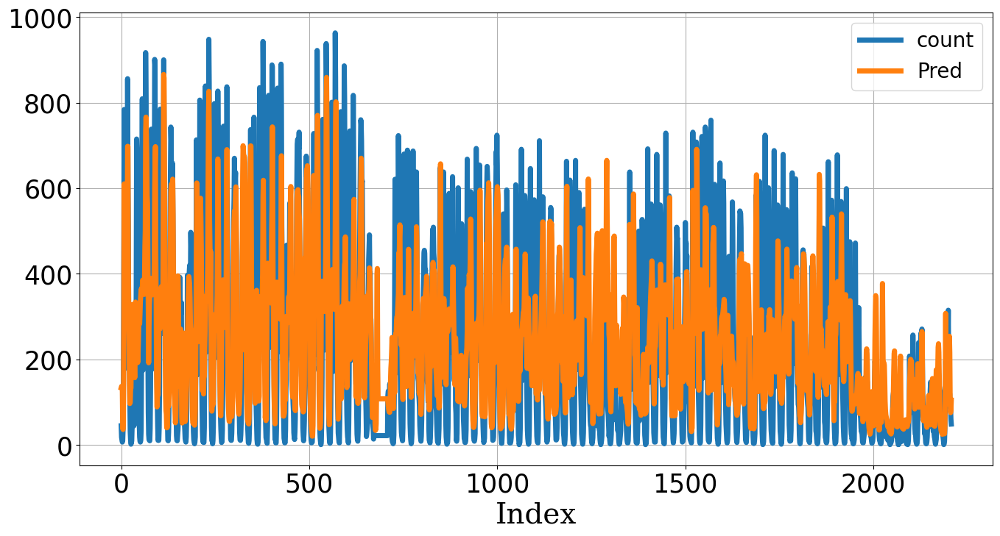

,MAE,MSE,MAPE
Train,77.21,"12,877.65",2.06
Test,110.81,"22,331.94",4.49


In [40]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Result Summary

MLP
69/69 [==============================] - 0s 2ms/step
CNN
69/69 [==============================] - 1s 9ms/step


,MAE,MSE,MAPE
MLP,132.63,"31,826.84",4.86
CNN,132.68,"32,828.46",4.67
RNN,146.42,"34,425.87",6.67
LSTM,163.76,"38,897.11",7.61
GRU,110.81,"22,331.94",4.49


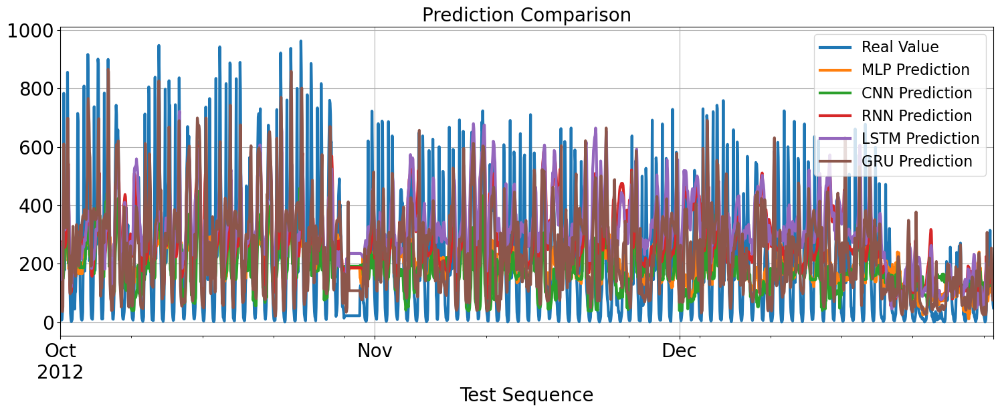

In [41]:
# 저장 모델 불러오기
modelnames = ['MLP', 'CNN', 'RNN', 'LSTM', 'GRU']

# 결과 정리
Y_pred, Score_final = Y_test.copy(), pd.DataFrame()
for each in modelnames:
    FILENAME = os.path.join(os.getcwd(),'Model','BikeSharing_'+each+'.h5')
    
    # 베스트 모델 로딩
    model = load_model(FILENAME)
    
    ## 예측하기
    if each in ['MLP', 'CNN']:
        print(each)
        Y_tepred = pd.DataFrame(model.predict(X_teprep2D), 
                                index=Y_teprep2D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg( Y_teprep2D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
    else:
        Y_tepred = pd.DataFrame(model.predict(X_teprep3D), 
                                index=Y_teprep3D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg(Y_teprep3D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
  
# 정리
Y_pred.columns = ['Real Value']+[i+' Prediction' for i in modelnames]
Score_final.index = modelnames
    
# 결과 출력
display(Score_final)
Y_pred.plot(kind='line', figsize=(18,6), linewidth=3, fontsize=20,
            xlim=(Y_pred.index.min(),Y_pred.index.max()))
plt.title('Prediction Comparison', fontsize=20)
plt.xlabel('Test Sequence', fontsize=20)
plt.ylabel('', fontsize=20)
plt.legend(fontsize=16)
plt.grid()
plt.show()

# **Problem:** 마케팅매출액 예측

- **최종 사용변수 설명:**

| **변수** | **설명** |
|:---:|:---:|
| **DATE** | 날짜 |
| **SALES** | 매출액 |
| **SMS** | 문자 마케팅 |
| **Newspaper ads** | 신문광고 마케팅 |
| **Radio** | 라디오 마케팅 |
| **TV** | TV 마케팅 |
| **Pay Per Click** | 클릭유도 마케팅 |
| **Offline** | 오프라인 마케팅 |
| **Contest** | 콘테스트 마케팅 |
| **Coupons** | 쿠폰 마케팅 |
| **Internet** | 인터넷 마케팅 |
| **Email to customers** | 이메일 마케팅 |
| **Facebook Post** | 페이스북게시물 마케팅 |
| **Facebook ads** | 페이스북광고 마케팅 |
| **Sponsership** | 스폰서 마케팅 |
| **Newsletter article** | 소식지 마케팅 |
| **Direct mail** | 직접홍보 마케팅 |
| **Poster** | 포스터 마케팅 |

## Data Preprocessing

In [42]:
# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 시간정보가 문자로 인식되는 경우 datetime 형식으로 변환하기
if 'DATE' in df.columns:
    df['DATE'] = pd.to_datetime(df['DATE'])

# df의 index를 시간정보로 변경하기
if df.index.dtype == 'int64':
    df.set_index('DATE', inplace=True)

# 최종적으로 데이터의 시간정보 빈도를 결정하고 NaN 값을 채운 후
df = df.asfreq('D', method='ffill')

# 종속변수와 독립변수 결정
Y_colname = ['SALES ($)']
X_remove = ['DIVISION', 'DEMAND (No. of Handsets)', 'SALES (No. of Handsets)', 'Variables,Adstock,Power,Lag']
X_colname = [x for x in df.columns if x not in Y_colname+X_remove]

# 정리
df = df.loc[df.index<'2016-01-01', Y_colname+X_colname]
Y_colname = ['SALES']
X_colname = [x.split('_')[len(x.split('_'))-1] for x in X_colname]
df.columns = Y_colname + X_colname
df

,SALES,SMS,Newspaper ads,Radio,TV,Pay Per Click,Offline,Contest,Coupons,Internet,Email to customers,Facebook Post,Facebook ads,Sponsership,Newsletter article,Direct mail,Poster
DATE,,,,,,,,,,,,,,,,,
2010-01-01,"1,533,299.16",77.48,14.10,112.34,"1,479.46",95.33,11.84,10.30,9.70,722.57,91.00,276.36,756.59,181.36,72.77,13.05,27.05
2010-01-02,"1,681,816.96",73.48,13.30,105.71,"1,369.89",114.96,27.80,5.52,10.65,717.86,111.91,291.32,860.14,208.63,376.86,32.95,158.45
2010-01-03,"1,353,028.79",80.61,13.20,108.77,"1,428.06",113.09,0.00,6.62,7.53,653.33,94.64,282.73,751.95,181.20,51.77,6.59,21.45
2010-01-04,"1,488,860.84",65.93,12.72,93.31,"1,309.35",72.44,0.00,10.16,4.78,622.10,98.59,306.32,749.45,194.33,73.50,7.23,25.05
2010-01-05,"1,633,299.16",77.48,14.10,112.34,"1,479.46",95.33,11.84,10.30,9.70,722.57,91.00,276.36,756.59,181.36,72.77,13.05,27.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-27,"8,499,431.32",42.83,11.44,77.91,"1,161.94",132.12,15.16,0.48,3.99,"2,675.61",168.14,304.18,"1,378.09",249.80,91.32,13.27,26.18
2015-12-28,"7,480,844.15",37.92,11.89,62.97,"1,251.25",85.02,20.98,0.51,4.29,"2,705.77",178.97,381.93,"1,466.82",313.65,123.30,14.13,32.87
2015-12-29,"7,312,018.52",38.93,10.69,79.35,"1,090.94",42.85,36.35,0.50,4.16,"4,268.16",131.80,378.63,"1,080.27",310.94,109.67,10.40,32.58


In [43]:
# Train & Test 분할
df_train = df.loc[df.index < '2015-01-01',:]
df_test = df.loc[df.index >= '2015-01-01',:]

# X_train, Y_train, X_test, Y_test 분할
Y_train = df_train[Y_colname]/1000
X_train = df_train[X_colname]
Y_test = df_test[Y_colname]/1000
X_test = df_test[X_colname]

# 데이터 스케일링
scaler = preprocessing.MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
print('---------------train----------------')
print('normalized X: ', X_train.shape, X_train.min(), X_train.max())
print('----------------test----------------')
print('normalized X: ', X_test.shape, X_test.min(), X_test.max())

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0


In [44]:
# 데이터 전처리 함수화
def preprocessing_MarketingSales(df):
    # 시간정보가 문자로 인식되는 경우 datetime 형식으로 변환하기
    if 'DATE' in df.columns:
        df['DATE'] = pd.to_datetime(df['DATE'])

    # df의 index를 시간정보로 변경하기
    if df.index.dtype == 'int64':
        df.set_index('DATE', inplace=True)

    # 최종적으로 데이터의 시간정보 빈도를 결정하고 NaN 값을 채운 후
    df = df.asfreq('D', method='ffill')

    # 종속변수와 독립변수 결정
    Y_colname = ['SALES ($)']
    X_remove = ['DIVISION', 'DEMAND (No. of Handsets)', 'SALES (No. of Handsets)', 'Variables,Adstock,Power,Lag']
    X_colname = [x for x in df.columns if x not in Y_colname+X_remove]

    # 정리
    df = df.loc[df.index<'2016-01-01', Y_colname+X_colname]
    Y_colname = ['SALES']
    X_colname = [x.split('_')[len(x.split('_'))-1] for x in X_colname]
    df.columns = Y_colname + X_colname
    
    # Train & Test 분할
    df_train = df.loc[df.index < '2015-01-01',:]
    df_test = df.loc[df.index >= '2015-01-01',:]

    # X_train, Y_train, X_test, Y_test 분할
    Y_train = df_train[Y_colname]/1000
    X_train = df_train[X_colname]
    Y_test = df_test[Y_colname]/1000
    X_test = df_test[X_colname]

    # 데이터 스케일링
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    print('---------------train----------------')
    print('normalized X: ', X_train.shape, X_train.min(), X_train.max())
    print('----------------test----------------')
    print('normalized X: ', X_test.shape, X_test.min(), X_test.max())
    
    return X_train, X_test, Y_train, Y_test

# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0


In [45]:
# 데이터 백업
X_trprep2D, X_teprep2D = X_train.copy(), X_test.copy()
Y_trprep2D, Y_teprep2D = Y_train.copy(), Y_test.copy()

## MLP

<center><img src='Image/Expert/DL_MLP_Custom.PNG' width='500'></center>

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0
Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 16)]              0         
                                                                 
 dense_9 (Dense)             (None, 128)               2176      
                                                                 
 dropout_12 (Dropout)        (None, 128)               0         
                                                                 
 dense_10 (Dense)            (None, 64)                8256      
                                                                 
 dropout_13 (Dropout)        (None, 64)                0         
                                                                 
 dense_11 (Dense)            (None, 32)           

Training:   0%|                                                                                               …

Epoch 235: early stopping


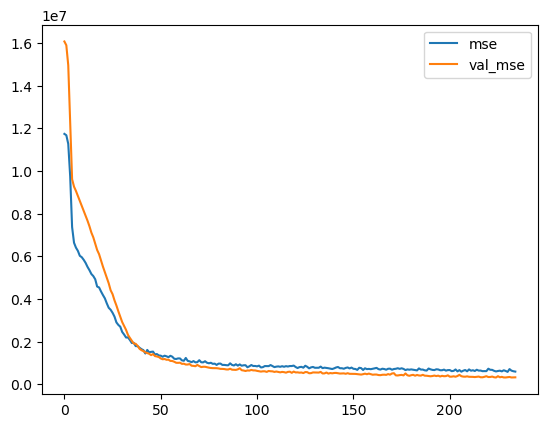

12/12 [==============================] - 0s 1ms/step


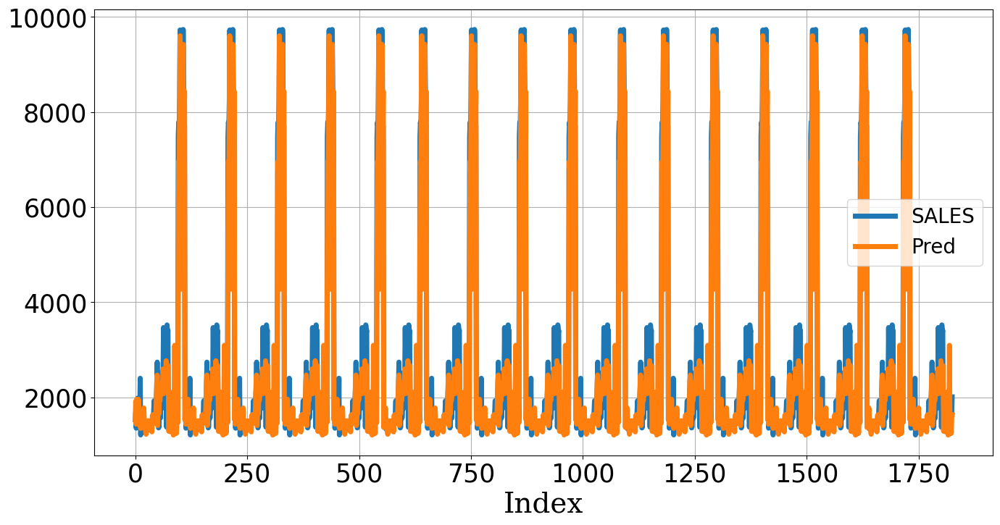

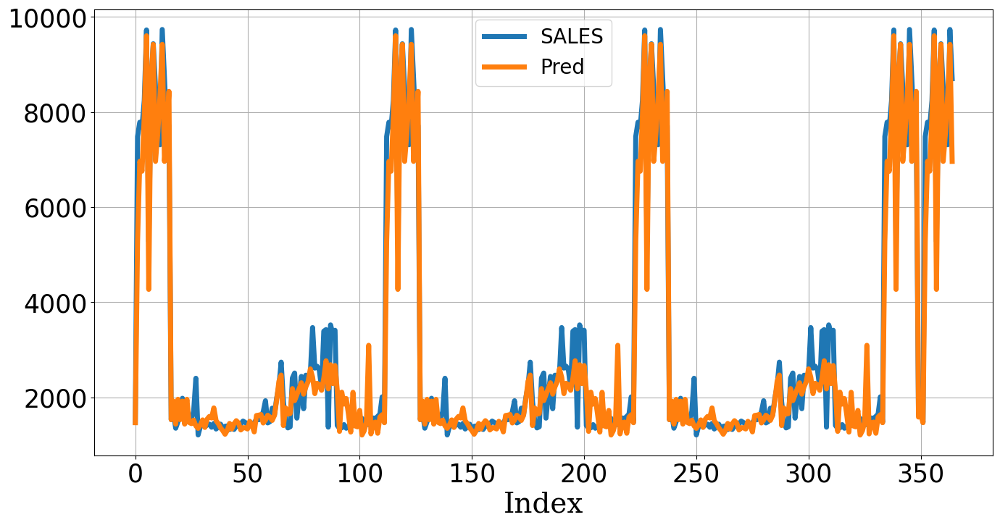

,MAE,MSE,MAPE
Train,332.39,"267,327.39",0.14
Test,362.61,"324,241.11",0.14


In [46]:
# 하이퍼파라미터
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 300
VERBOSE = 0
################
EARLYSTOP_PATIENT = 10
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','MarketingSales_MLP.h5')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', 
                                    patience=EARLYSTOP_PATIENT, verbose=1),
            tfa.callbacks.TQDMProgressBar(show_epoch_progress=False),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, 
                      validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

12/12 [==============================] - 0s 2ms/step


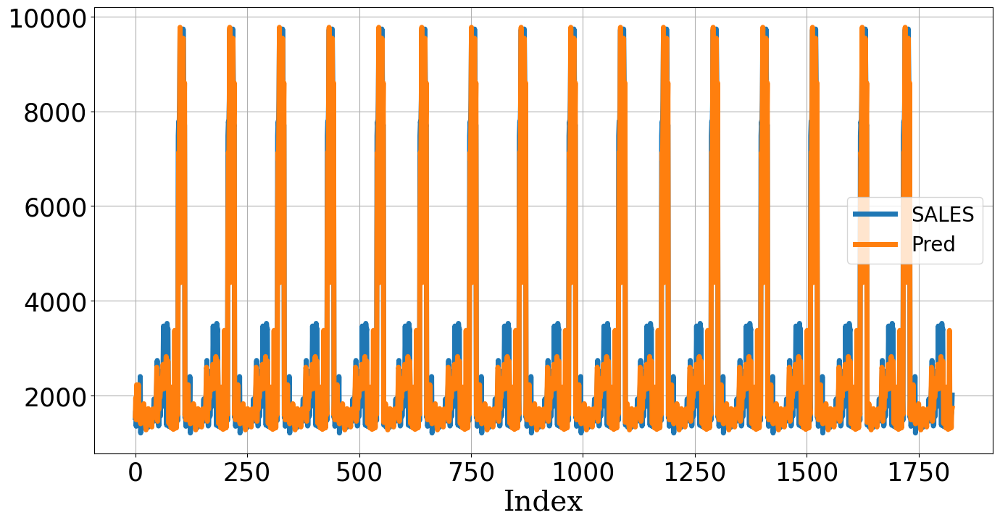

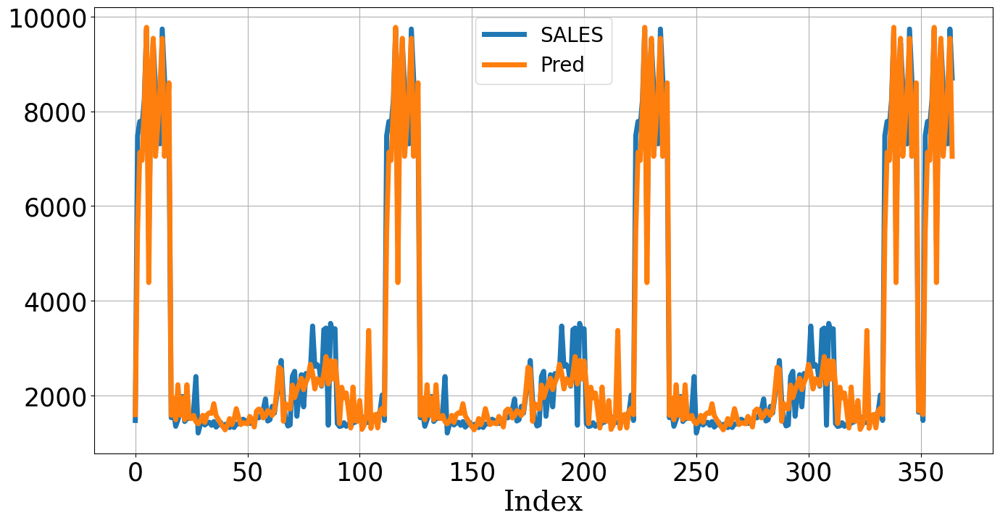

,MAE,MSE,MAPE
Train,339.53,"270,126.08",0.15
Test,366.27,"317,594.11",0.15


In [47]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## CNN

<center><img src='Image/Expert/CNN_Example.webp' width='900'></center>

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0
X_train: (1826, 16, 1) Y_train: (1826, 1)
X_test: (365, 16, 1) Y_test: (365, 1)
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 16, 1)]           0         
                                                                 
 conv1d_2 (Conv1D)           (None, 16, 128)           512       
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 8, 128)           0         
 1D)                                                             
                                                                 
 dropout_15 (Dropout)        (None, 8, 128)            0         
                                                                 
 conv1d_3 (Conv1D)           (None, 

Training:   0%|                                                                                               …

Epoch 271: early stopping


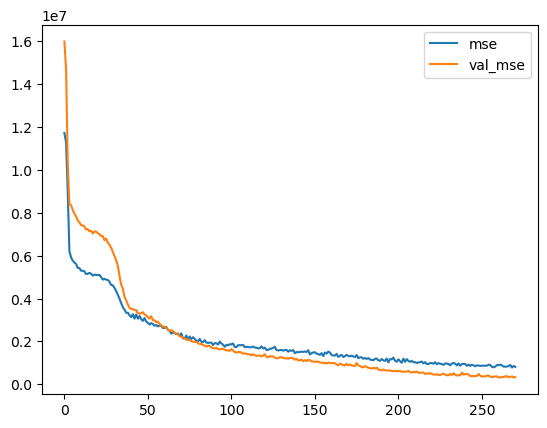

12/12 [==============================] - 0s 5ms/step


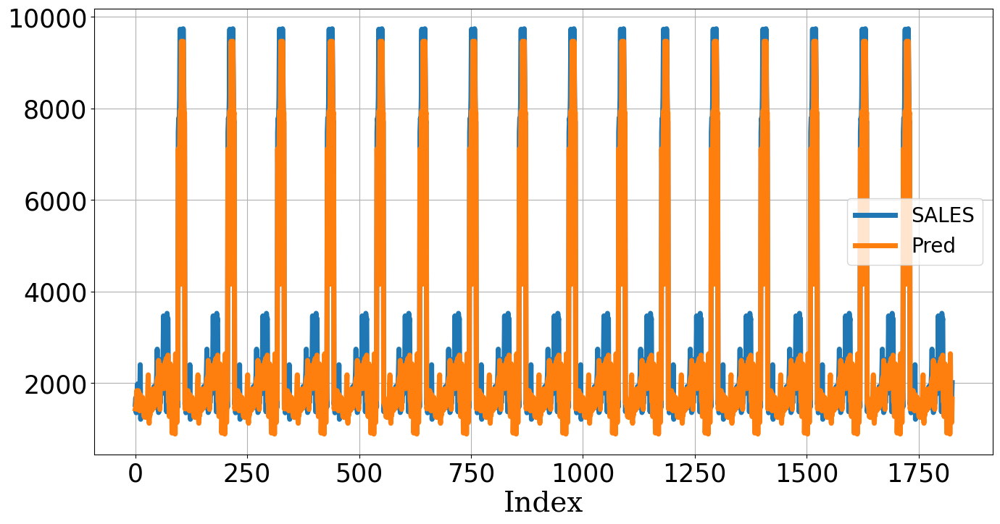

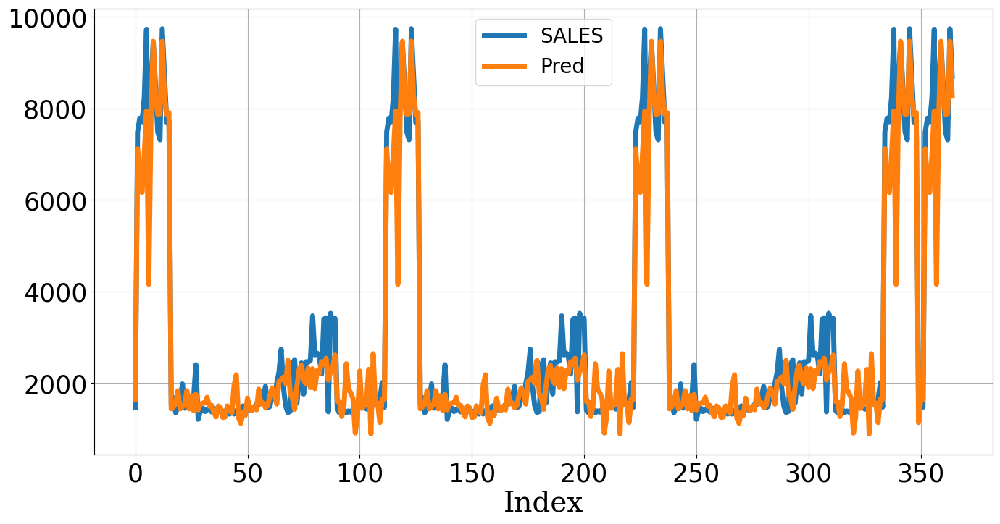

,MAE,MSE,MAPE
Train,397.11,"297,588.77",0.18
Test,420.83,"336,186.53",0.17


In [48]:
# 하이퍼파라미터
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 300
VERBOSE = 0
################
EARLYSTOP_PATIENT = 10
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','MarketingSales_CNN.h5')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', 
                                    patience=EARLYSTOP_PATIENT, verbose=1),
            tfa.callbacks.TQDMProgressBar(show_epoch_progress=False),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

# Reshape
X_train = X_train.reshape(-1, X_train.shape[1], 1)
X_test = X_test.reshape(-1, X_test.shape[1], 1)
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))   
hiddens = Conv1D(128, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(inputs)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Conv1D(64, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION)(hiddens)  
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, 
                      validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

12/12 [==============================] - 0s 2ms/step


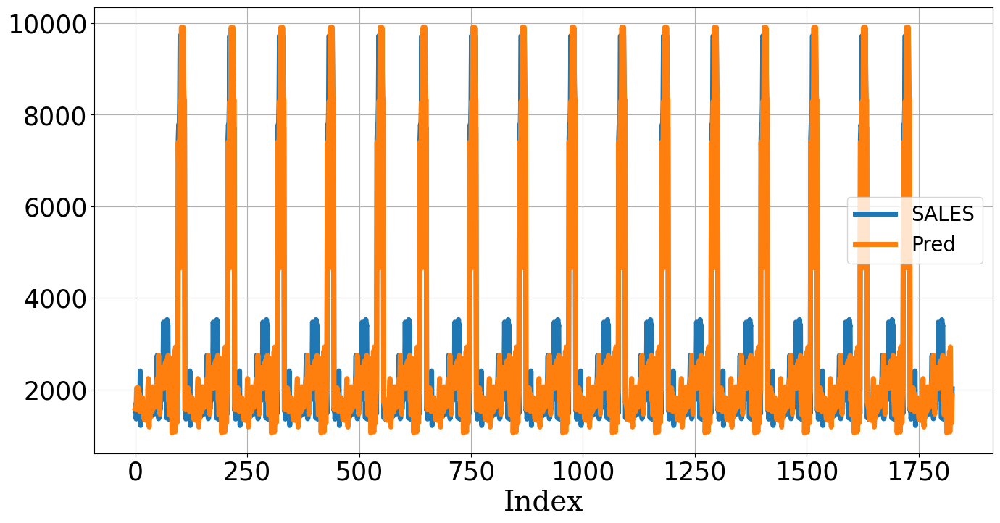

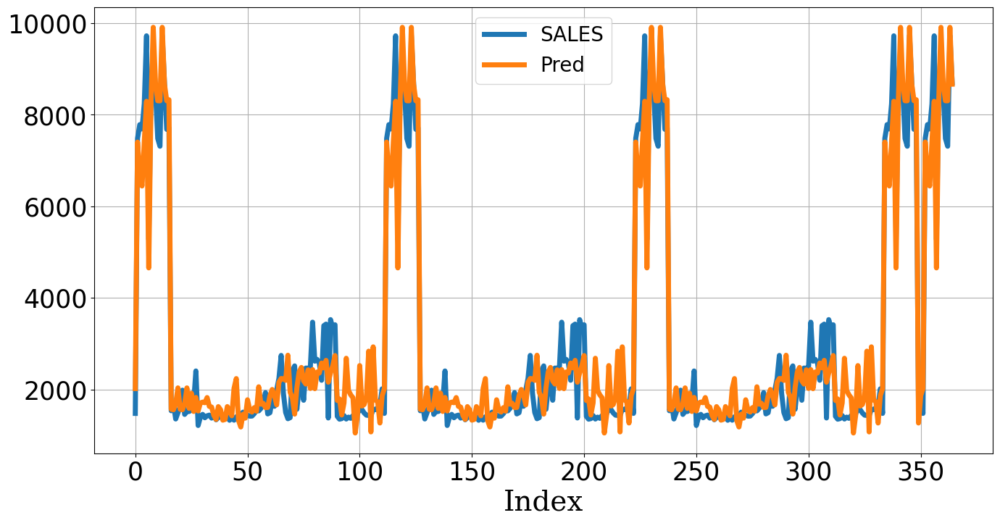

,MAE,MSE,MAPE
Train,419.75,"303,614.37",0.21
Test,434.89,"322,467.76",0.20


In [49]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Data Reshaping

- **종속변수 Y와 독립변수 X의 전처리 필요!**

<center><img src='Image/Expert/Reshape_2Dto3DSeq.png' width='1100'></center>

In [50]:
# Reshape


print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

origin X:  (2191, 16, 1) -> reshape X:  (2185, 7, 16, 1)
origin Y:  (2191, 1) -> reshape Y:  (2185, 1)
X_train: (1820, 7, 16, 1) Y_train: (1820, 1)
X_test: (365, 7, 16, 1) Y_test: (365, 1)


In [51]:
# 데이터 백업
X_trprep3D, X_teprep3D = X_train.copy(), X_test.copy()
Y_trprep3D, Y_teprep3D = Y_train.copy(), Y_test.copy()

## RNN

<center><img src='Image/Expert/DL_RNN_UnfoldFold.PNG' width='600'></center>

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0
origin X:  (2191, 16) -> reshape X:  (2185, 7, 16)
origin Y:  (2191, 1) -> reshape Y:  (2185, 1)
X_train: (1820, 7, 16) Y_train: (1820, 1)
X_test: (365, 7, 16) Y_test: (365, 1)
Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 7, 16)]           0         
                                                                 
 simple_rnn_2 (SimpleRNN)    (None, 7, 128)            18560     
                                                                 
 dropout_18 (Dropout)        (None, 7, 128)            0         
                                                                 
 simple_rnn_3 (SimpleRNN)    (None, 7, 64)             12352     
                                                                 
 drop

Training:   0%|                                                                                               …

Epoch 165: early stopping


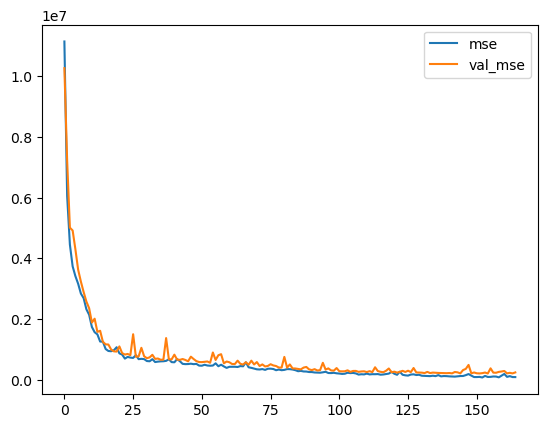

12/12 [==============================] - 0s 4ms/step


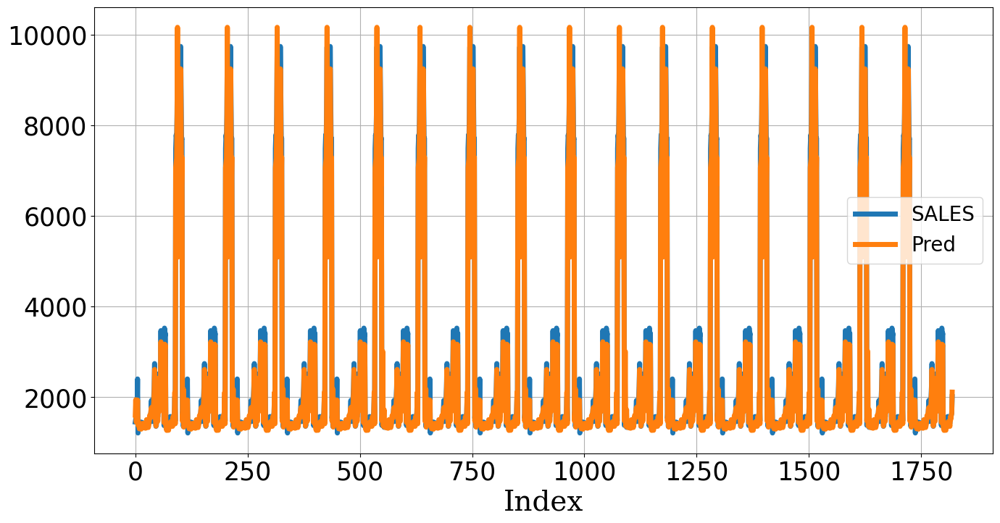

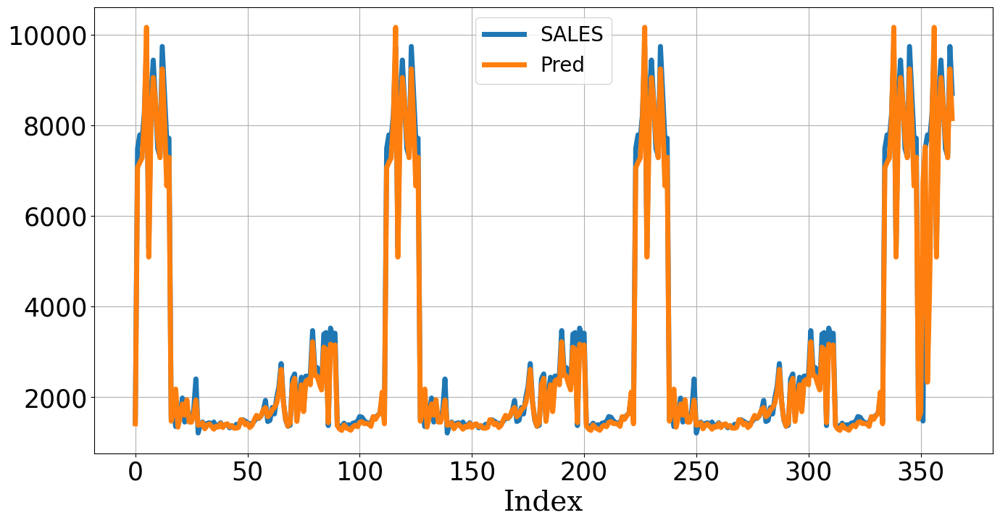

,MAE,MSE,MAPE
Train,141.38,"52,783.53",0.05
Test,193.15,"243,955.64",0.07


In [52]:
# 하이퍼파라미터


# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

# Reshape


# 네트워크 구축


## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

12/12 [==============================] - 0s 4ms/step


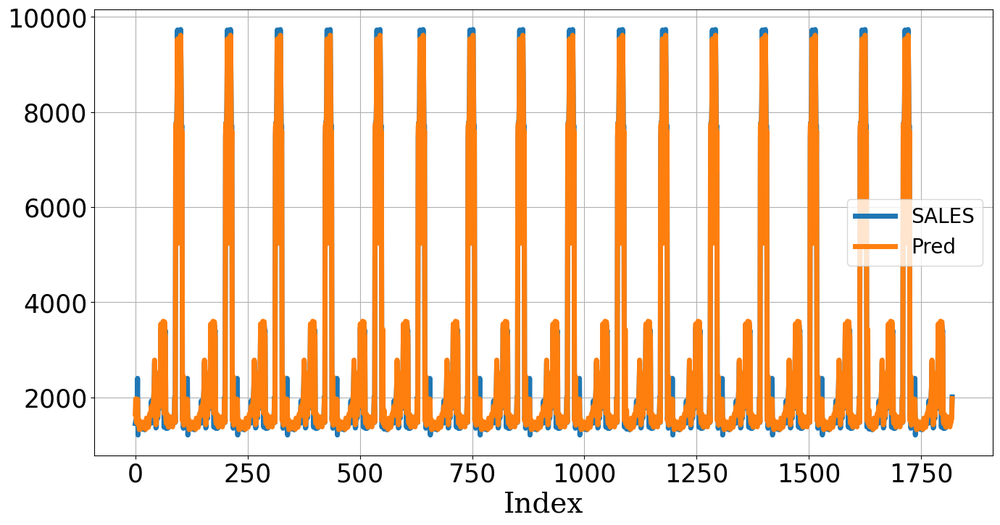

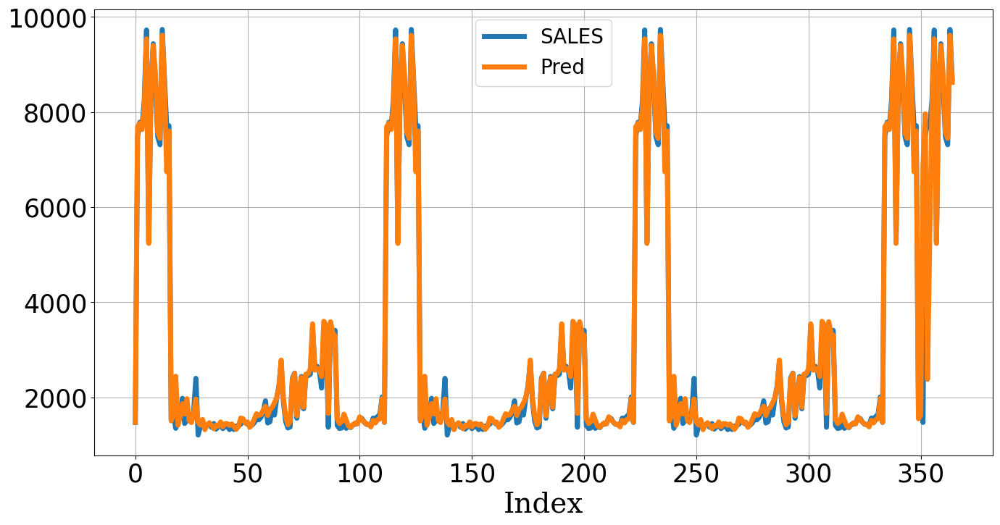

,MAE,MSE,MAPE
Train,100.46,"36,256.07",0.05
Test,139.22,"208,461.40",0.06


In [53]:
# 베스트 모델 로딩


## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## LSTM

<center><img src='Image/Expert/DL_RNN_Operation.png' width='700'>(http://colah.github.io/posts/2015-08-Understanding-LSTMs/)</center>

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0
origin X:  (2191, 16) -> reshape X:  (2185, 7, 16)
origin Y:  (2191, 1) -> reshape Y:  (2185, 1)
X_train: (1820, 7, 16) Y_train: (1820, 1)
X_test: (365, 7, 16) Y_test: (365, 1)
Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 7, 16)]           0         
                                                                 
 lstm_2 (LSTM)               (None, 7, 128)            74240     
                                                                 
 dropout_20 (Dropout)        (None, 7, 128)            0         
                                                                 
 lstm_3 (LSTM)               (None, 7, 64)             49408     
                                                                 
 drop

Training:   0%|                                                                                               …

Epoch 63: early stopping


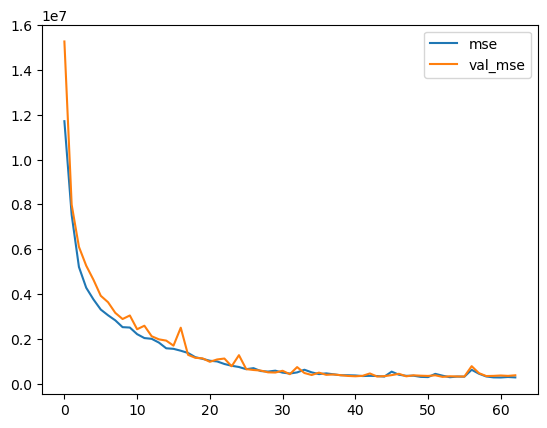

12/12 [==============================] - 0s 5ms/step


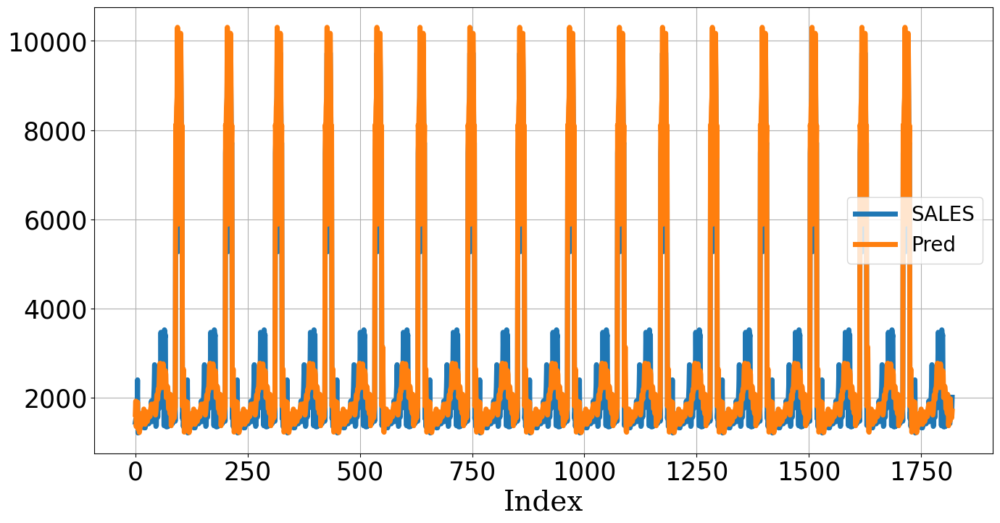

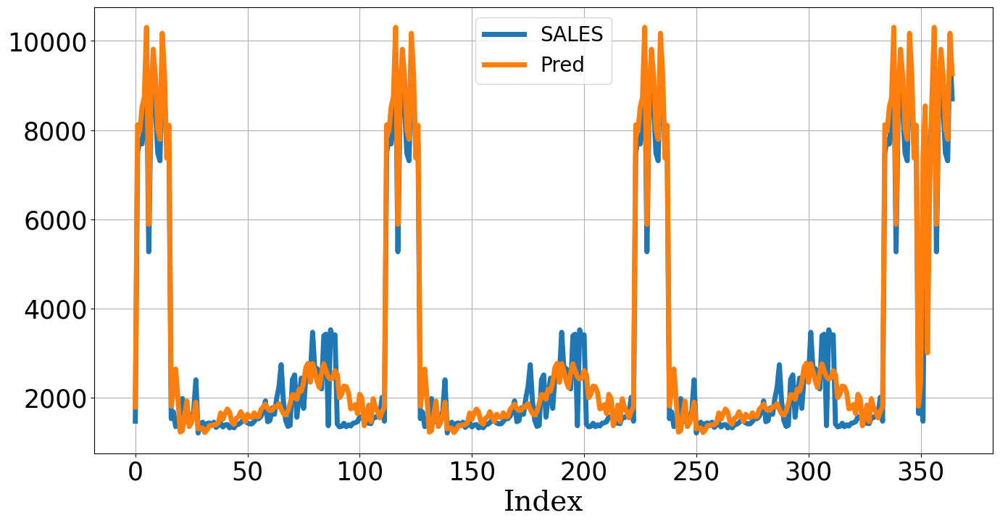

,MAE,MSE,MAPE
Train,358.57,"208,252.81",0.18
Test,394.99,"368,873.52",0.18


In [54]:
# 하이퍼파라미터


# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

# Reshape


# 네트워크 구축


## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

12/12 [==============================] - 0s 5ms/step


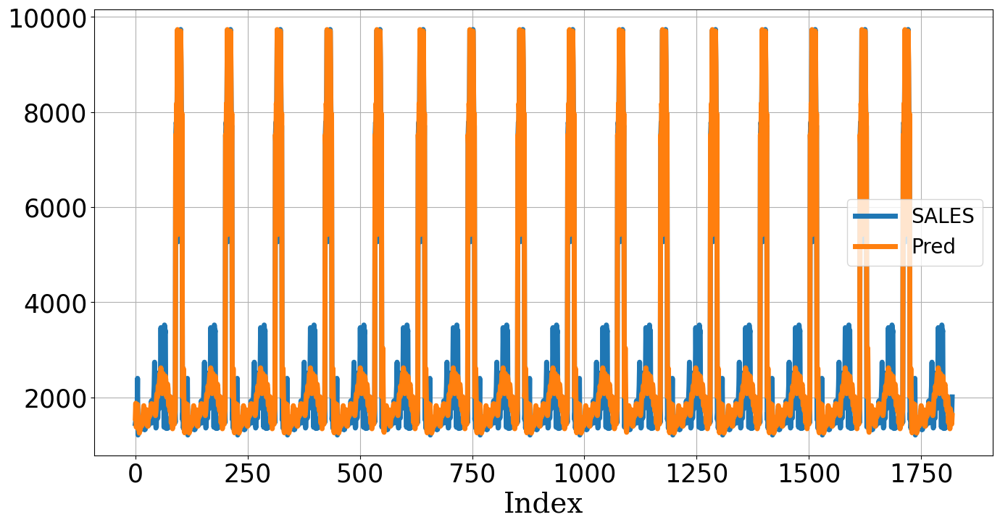

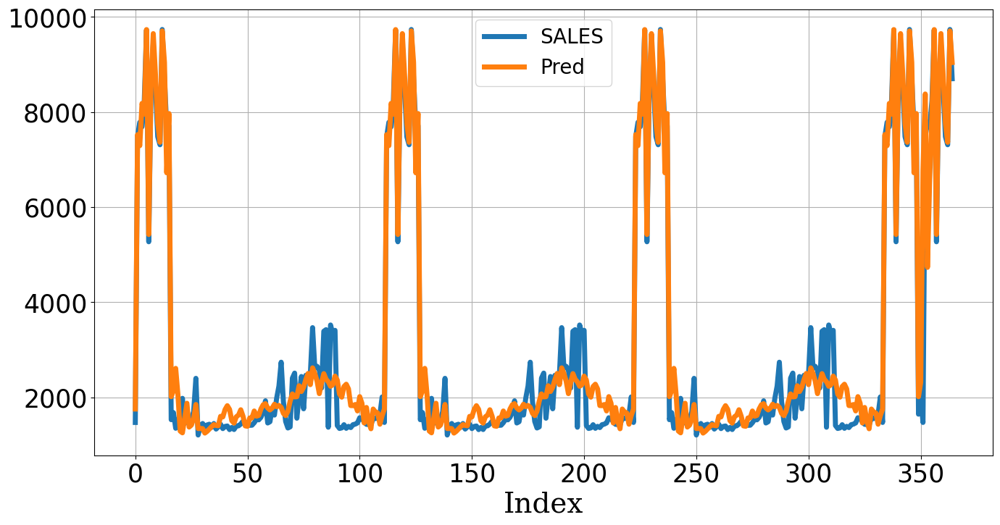

,MAE,MSE,MAPE
Train,339.14,"205,907.50",0.18
Test,351.35,"297,592.36",0.17


In [55]:
# 베스트 모델 로딩


## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## GRU

<center><img src='Image/Expert/DL_LSTM_GRU.png' width='700'>(https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21)</center>

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0
origin X:  (2191, 16) -> reshape X:  (2185, 7, 16)
origin Y:  (2191, 1) -> reshape Y:  (2185, 1)
X_train: (1820, 7, 16) Y_train: (1820, 1)
X_test: (365, 7, 16) Y_test: (365, 1)
Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 7, 16)]           0         
                                                                 
 gru_2 (GRU)                 (None, 7, 128)            56064     
                                                                 
 dropout_22 (Dropout)        (None, 7, 128)            0         
                                                                 
 gru_3 (GRU)                 (None, 7, 64)             37248     
                                                                 
 drop

Training:   0%|                                                                                               …

Epoch 121: early stopping


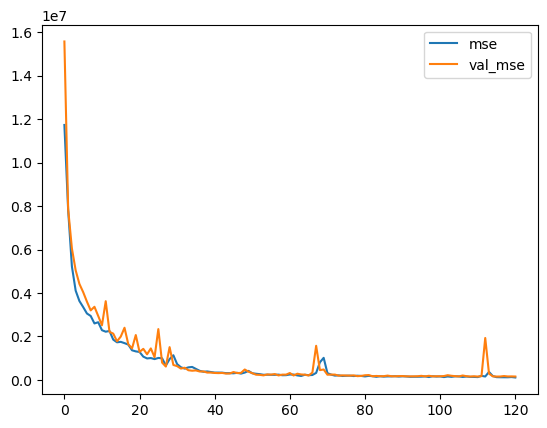

12/12 [==============================] - 0s 6ms/step


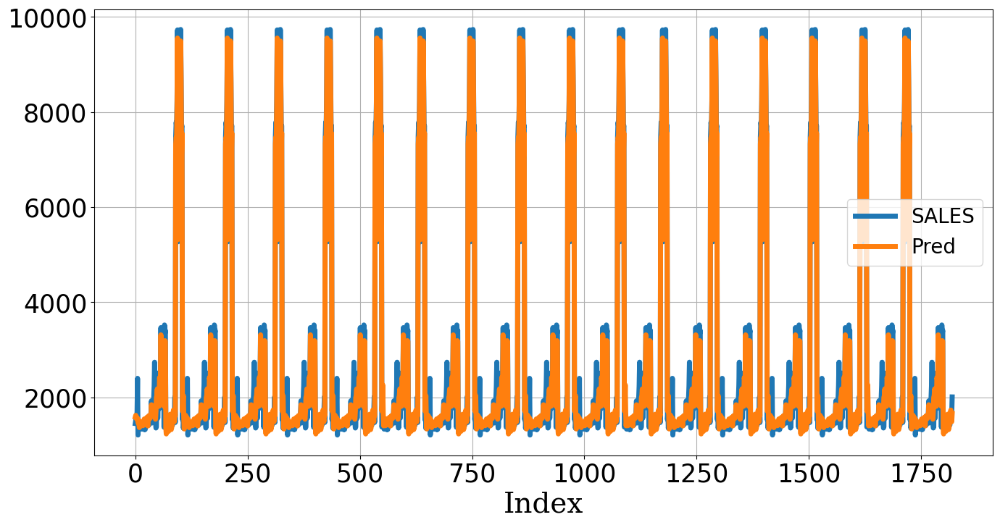

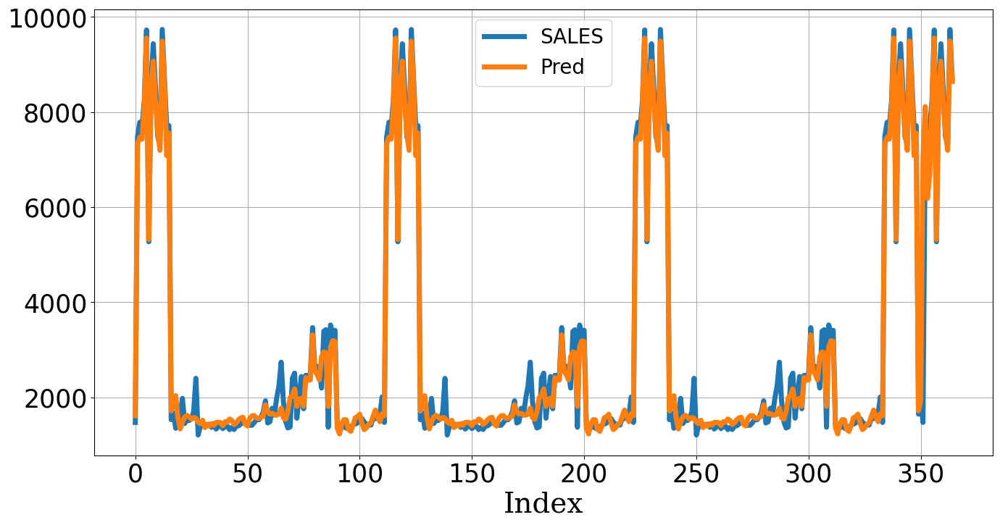

,MAE,MSE,MAPE
Train,185.31,"67,297.77",0.09
Test,206.13,"159,993.33",0.10


In [56]:
# 하이퍼파라미터


# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

# Reshape


# 네트워크 구축


## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

12/12 [==============================] - 0s 7ms/step


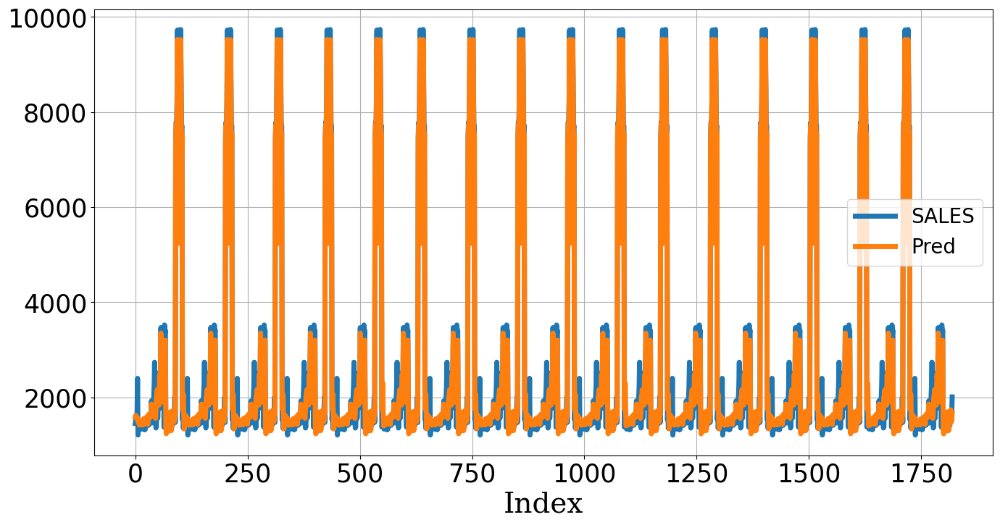

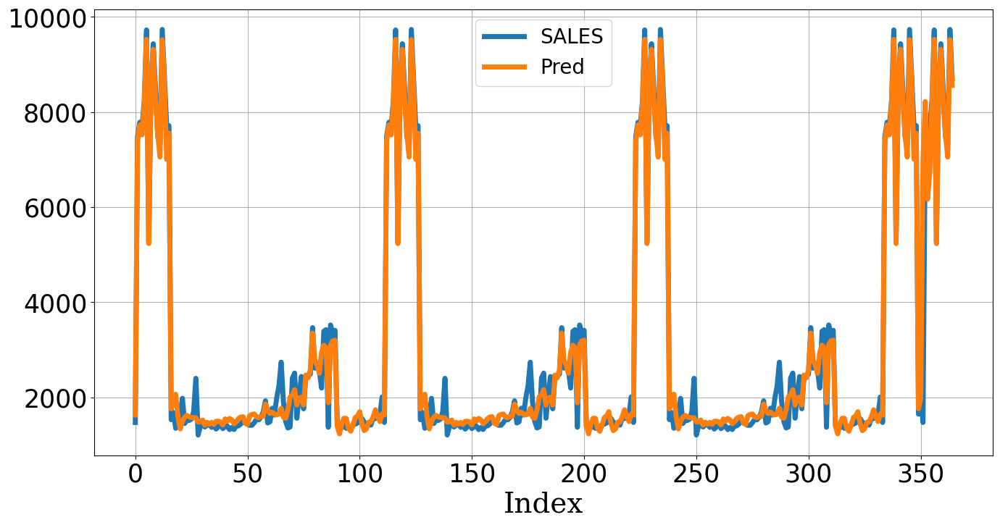

,MAE,MSE,MAPE
Train,183.61,"67,551.75",0.09
Test,202.39,"158,516.18",0.10


In [57]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Result Summary

MLP
12/12 [==============================] - 0s 2ms/step
CNN
12/12 [==============================] - 0s 6ms/step


,MAE,MSE,MAPE
MLP,366.27,"317,594.11",0.15
CNN,434.89,"322,467.76",0.20
RNN,139.22,"208,461.40",0.06
LSTM,351.35,"297,592.36",0.17
GRU,202.39,"158,516.18",0.10


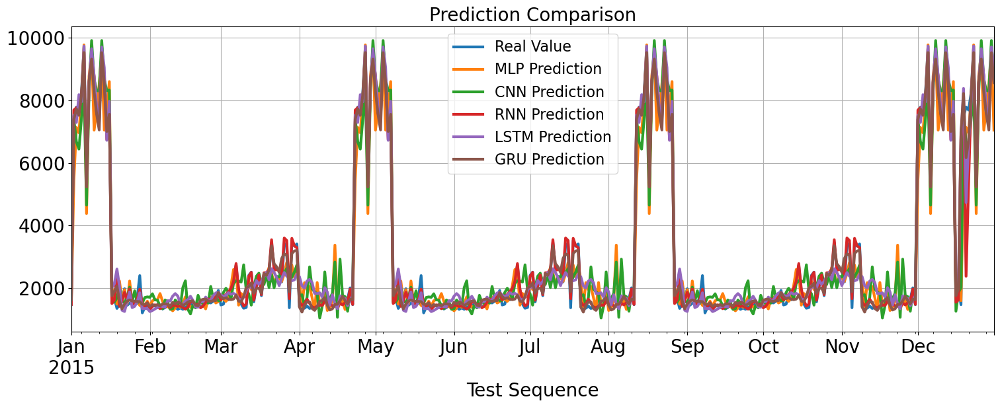

In [58]:
# 저장 모델 불러오기
modelnames = ['MLP', 'CNN', 'RNN', 'LSTM', 'GRU']

# 결과 정리
Y_pred, Score_final = Y_test.copy(), pd.DataFrame()
for each in modelnames:
    FILENAME = os.path.join(os.getcwd(),'Model','MarketingSales_'+each+'.h5')
    
    # 베스트 모델 로딩
    model = load_model(FILENAME)
    
    ## 예측하기
    if each in ['MLP', 'CNN']:
        print(each)
        Y_tepred = pd.DataFrame(model.predict(X_teprep2D), 
                                index=Y_teprep2D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg( Y_teprep2D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
    else:
        Y_tepred = pd.DataFrame(model.predict(X_teprep3D), 
                                index=Y_teprep3D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg(Y_teprep3D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
  
# 정리
Y_pred.columns = ['Real Value']+[i+' Prediction' for i in modelnames]
Score_final.index = modelnames
    
# 결과 출력
display(Score_final)
Y_pred.plot(kind='line', figsize=(18,6), linewidth=3, fontsize=20,
            xlim=(Y_pred.index.min(),Y_pred.index.max()))
plt.title('Prediction Comparison', fontsize=20)
plt.xlabel('Test Sequence', fontsize=20)
plt.ylabel('', fontsize=20)
plt.legend(fontsize=16)
plt.grid()
plt.show()

# **Problem:** 비트코인가격 예측

| **Date** | **Price** |
|:---:|:---:|
| **2014-09-16** | 457.33 |
| **2014-09-17** | 424.44 |
| **2014-09-18** | 394.8 |
| **2014-09-19** | 408.9 |
| **2014-09-20** | 398.82 |
| **...** | ... |
| **2021-04-23** | 50,050.87 |
| **2021-04-24** | 49,004.25 |
| **2021-04-25** | 54,021.75 |
| **2021-04-26** | 55,033.12 |
| **2021-04-27** | 54,824.70 |

## Data Preprocessing

**1) Many-to-One:**

<center><img src='Image/Expert/Reshape_1Dto2D_ManytoOne.png' width='1100'></center>

---

**2) Many-to-Many:**

<center><img src='Image/Expert/Reshape_1Dto2D_ManytoMany.png' width='1100'></center>

In [59]:
# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

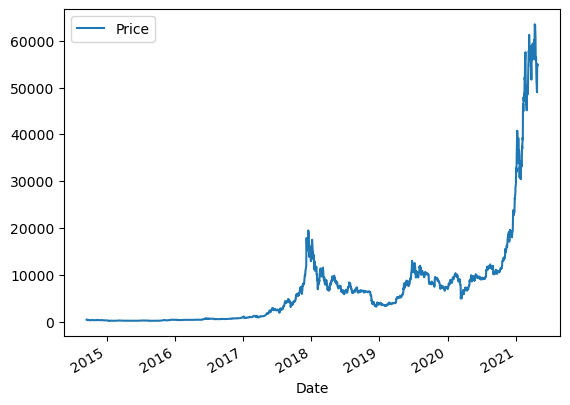

In [60]:
# 비트코인 가격 시각화
df.plot()
plt.show()

In [61]:
# sequence 데이터 추출 및 변환
X_seqleng = 3
Y_seqleng = 2


print('origin DF: ', df.shape, '-> reshape X: ', X_reshape.shape, '+ reshape Y: ', Y_reshape.shape)

origin DF:  (2412, 1) -> reshape X:  (2407, 3) + reshape Y:  (2407, 2)


In [62]:
# reshape 함수화
def reshape_1Dto2Dseq(df, X_seqleng, Y_seqleng):
    # generate sequence
    seq_length = X_seqleng + Y_seqleng
    X_reshape, Y_reshape = [], []
    for index in range(len(df) - seq_length): # 2D: seq_length+1
        X_reshape.append(np.array(df[index: index + seq_length]))

    # arrange
    X_reshape = np.array(X_reshape)
    X_reshape = pd.DataFrame(X_reshape.reshape(X_reshape.shape[0], -1), 
                             index=df.index[seq_length:])
    X_reshape.columns = [df.columns[0]+'_t'+str(i) for i in range(seq_length)]
    Y_reshape = X_reshape.iloc[:,-Y_seqleng:]
    X_reshape = X_reshape.iloc[:,:-Y_seqleng]
    print('origin DF: ', df.shape, '-> reshape X: ', X_reshape.shape, '+ reshape Y: ', Y_reshape.shape)
    
    return X_reshape, Y_reshape

X_SEQUENCE=7
Y_SEQUENCE=1
X, Y = reshape_1Dto2Dseq(df, X_seqleng=X_SEQUENCE, Y_seqleng=Y_SEQUENCE)

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)


In [63]:
# train & test 형태 변경


print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

X_train: (2286, 7) Y_train: (2286, 1)
X_test: (118, 7) Y_test: (118, 1)


In [64]:
# 데이터 백업
X_trprep2D, X_teprep2D = X_train.copy(), X_test.copy()
Y_trprep2D, Y_teprep2D = Y_train.copy(), Y_test.copy()

## MLP

<center><img src='Image/Expert/DL_MLP_Custom.PNG' width='500'></center>

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)
X_train: (2286, 7) Y_train: (2286, 1)
X_test: (118, 7) Y_test: (118, 1)
Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 7)]               0         
                                                                 
 dense_18 (Dense)            (None, 128)               1024      
                                                                 
 dropout_24 (Dropout)        (None, 128)               0         
                                                                 
 dense_19 (Dense)            (None, 64)                8256      
                                                                 
 dropout_25 (Dropout)        (None, 64)                0         
                                                                 
 dense_20 (Dense)            (None, 32)        

Training:   0%|                                                                                               …

Epoch 64: early stopping


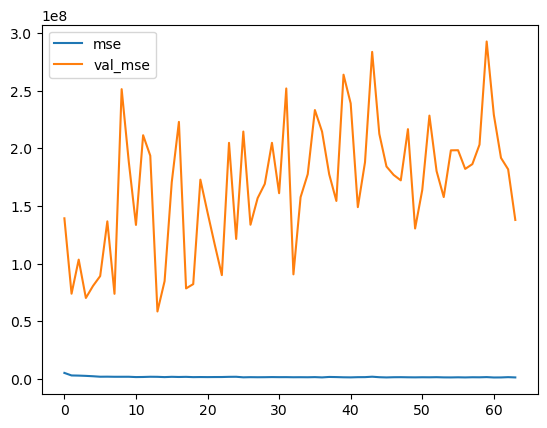

4/4 [==============================] - 0s 2ms/step


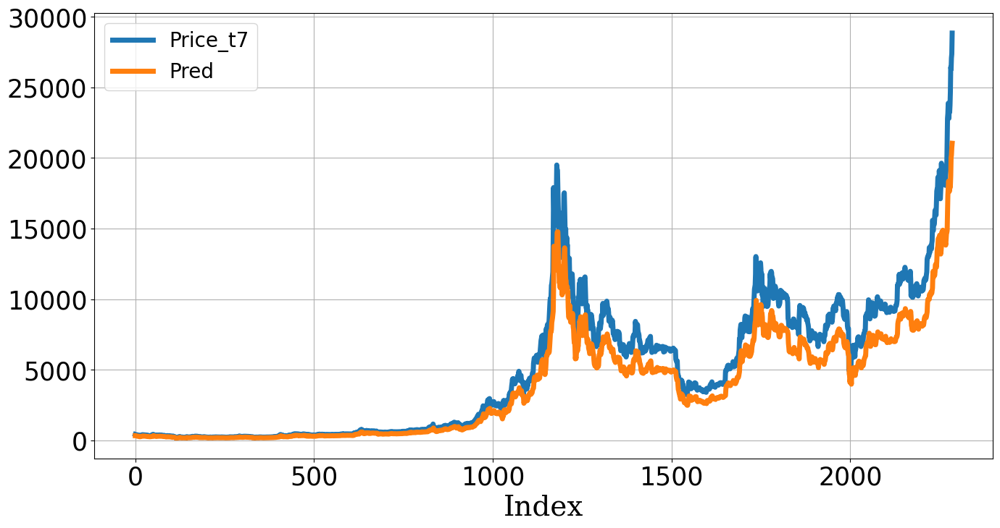

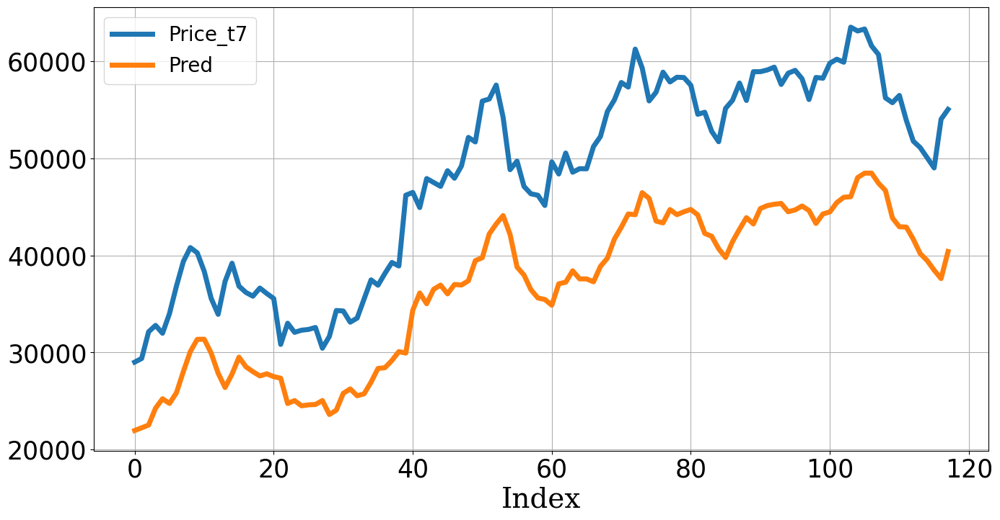

,MAE,MSE,MAPE
Train,"1,158.26","2,722,271.94",0.23
Test,"11,376.76","137,970,703.76",0.24


In [65]:
# 하이퍼파라미터
X_SEQUENCE=7
Y_SEQUENCE=1
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 200
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BitcoinPrice_MLP.h5')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', 
                                    patience=EARLYSTOP_PATIENT, verbose=1),
            tfa.callbacks.TQDMProgressBar(show_epoch_progress=False),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

# Reshape
X, Y = reshape_1Dto2Dseq(df, X_seqleng=X_SEQUENCE, Y_seqleng=Y_SEQUENCE)
TEST_CRITERIA = '2021-01-01'
X_train, Y_train = X.loc[X.index < TEST_CRITERIA,:], Y.loc[Y.index < TEST_CRITERIA,:]
X_test, Y_test = X.loc[X.index >= TEST_CRITERIA,:], Y.loc[Y.index >= TEST_CRITERIA,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

4/4 [==============================] - 0s 2ms/step


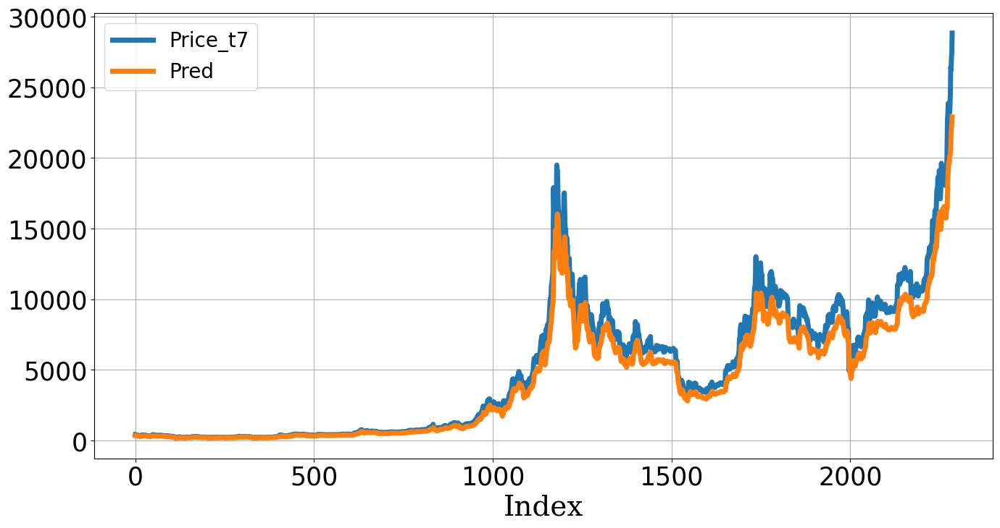

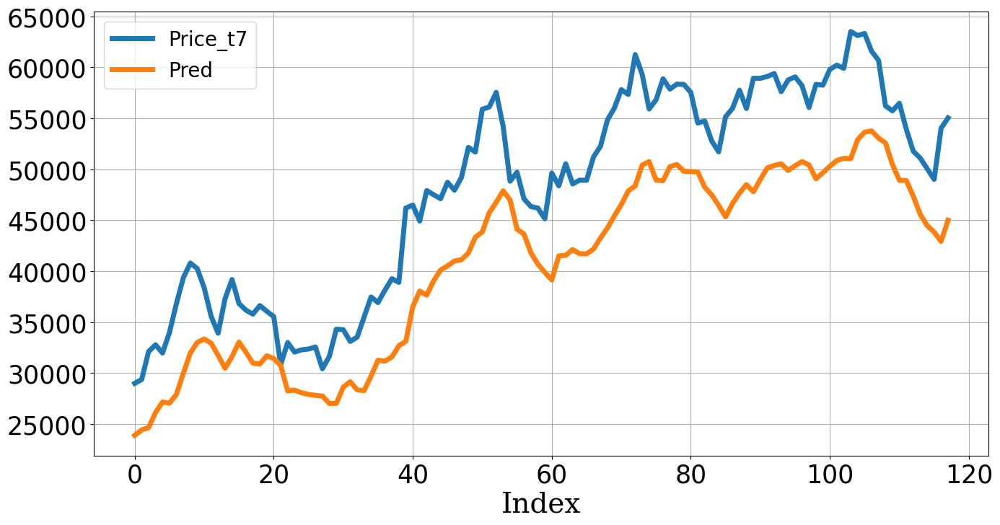

,MAE,MSE,MAPE
Train,724.79,"1,162,385.15",0.14
Test,"7,227.90","58,567,580.60",0.15


In [66]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## CNN

<center><img src='Image/Expert/CNN_Example.webp' width='900'></center>

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)
X_train: (2286, 7, 1) Y_train: (2286, 1)
X_test: (118, 7, 1) Y_test: (118, 1)
Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 7, 1)]            0         
                                                                 
 conv1d_4 (Conv1D)           (None, 7, 128)            512       
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 3, 128)           0         
 1D)                                                             
                                                                 
 dropout_27 (Dropout)        (None, 3, 128)            0         
                                                                 
 conv1d_5 (Conv1D)           (None, 3, 64)             24640     
                                         

Training:   0%|                                                                                               …

Epoch 148: early stopping


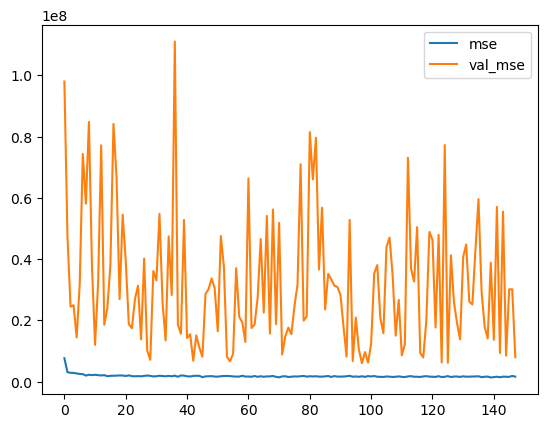

4/4 [==============================] - 0s 2ms/step


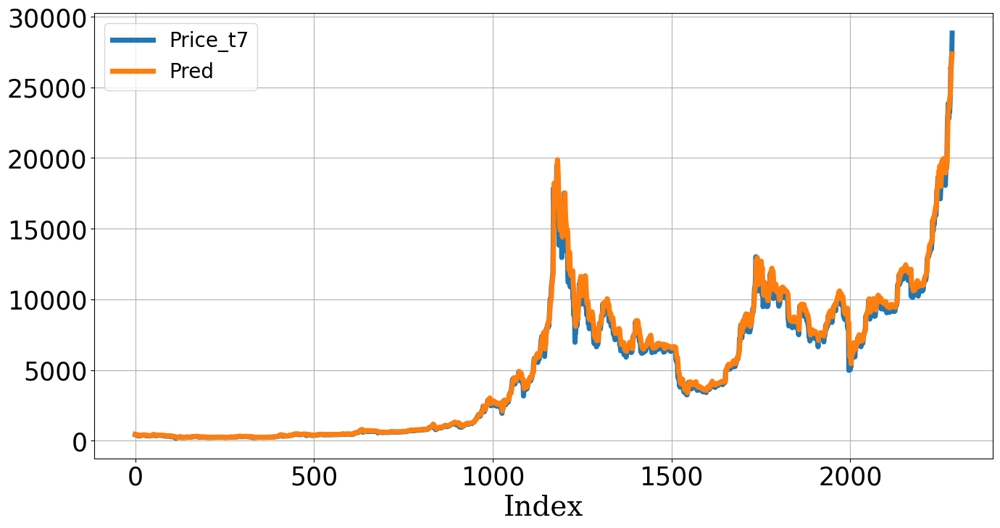

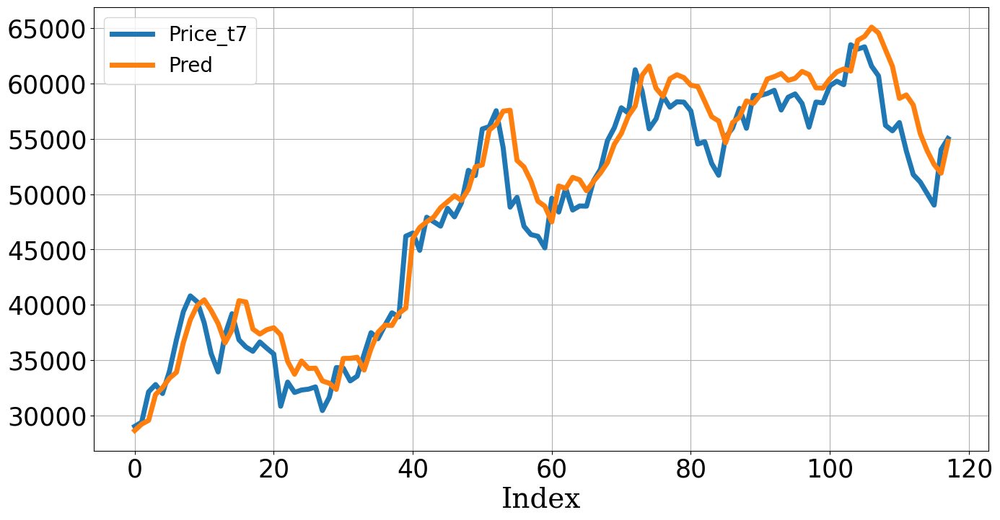

,MAE,MSE,MAPE
Train,226.90,"179,124.02",0.05
Test,"2,233.20","7,984,910.17",0.05


In [67]:
# 하이퍼파라미터
X_SEQUENCE=7
Y_SEQUENCE=1
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 200
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BitcoinPrice_CNN.h5')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', 
                                    patience=EARLYSTOP_PATIENT, verbose=1),
            tfa.callbacks.TQDMProgressBar(show_epoch_progress=False),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

# Reshape
X, Y = reshape_1Dto2Dseq(df, X_seqleng=X_SEQUENCE, Y_seqleng=Y_SEQUENCE)
TEST_CRITERIA = '2021-01-01'
X_train, Y_train = X.loc[X.index < TEST_CRITERIA,:], Y.loc[Y.index < TEST_CRITERIA,:]
X_test, Y_test = X.loc[X.index >= TEST_CRITERIA,:], Y.loc[Y.index >= TEST_CRITERIA,:]
X_train = X_train.values.reshape(-1, X_train.shape[1], 1)
X_test = X_test.values.reshape(-1, X_test.shape[1], 1)
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))   
hiddens = Conv1D(128, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(inputs)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Conv1D(64, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION)(hiddens)  
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

4/4 [==============================] - 0s 3ms/step


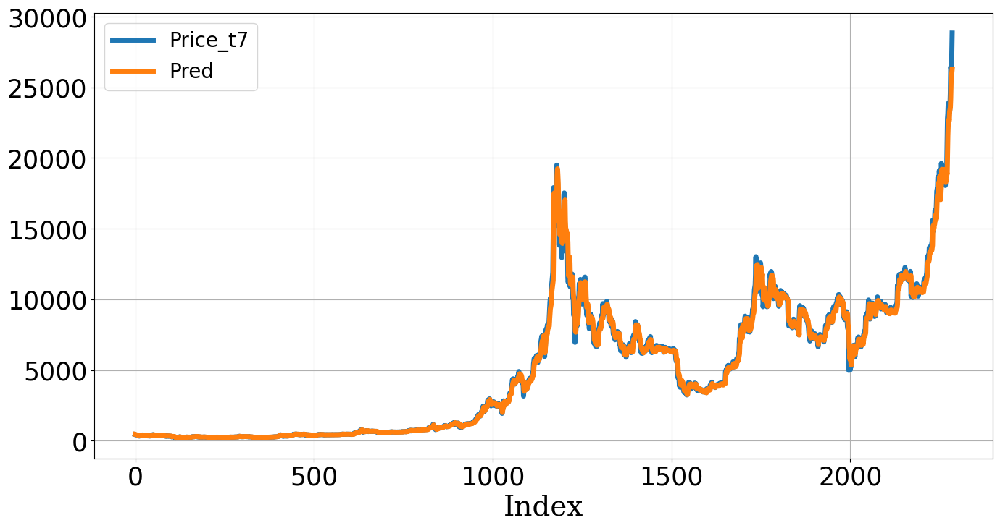

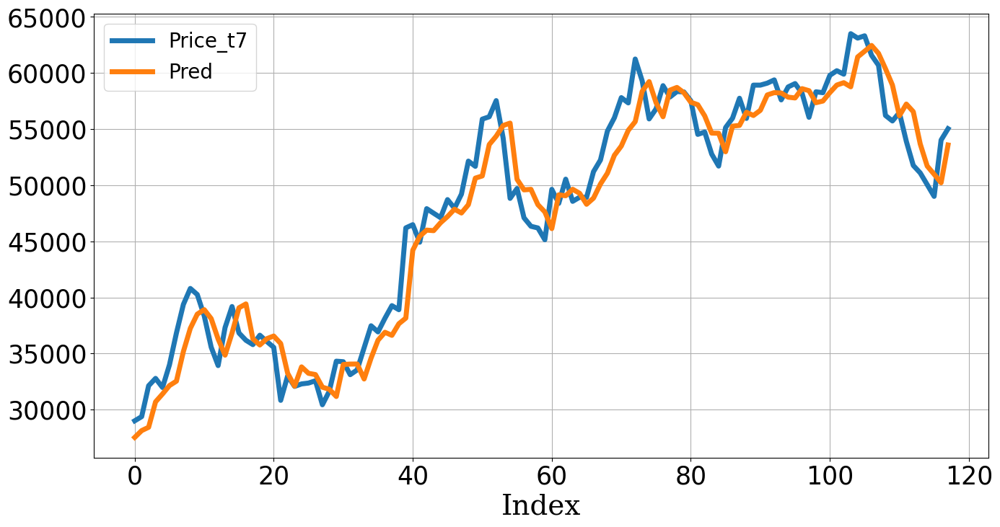

,MAE,MSE,MAPE
Train,178.51,"137,902.81",0.03
Test,"1,969.35","6,041,656.56",0.04


In [68]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## RNN

<center><img src='Image/Expert/DL_RNN_UnfoldFold.PNG' width='600'></center>

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)
X_train: (2286, 7, 1) Y_train: (2286, 1)
X_test: (118, 7, 1) Y_test: (118, 1)
Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 7, 1)]            0         
                                                                 
 simple_rnn_4 (SimpleRNN)    (None, 7, 128)            16640     
                                                                 
 dropout_30 (Dropout)        (None, 7, 128)            0         
                                                                 
 simple_rnn_5 (SimpleRNN)    (None, 7, 64)             12352     
                                                                 
 dropout_31 (Dropout)        (None, 7, 64)             0         
                                                                 
 flatten_9 (Flatten)         (None, 448) 

Training:   0%|                                                                                               …

Epoch 142: early stopping


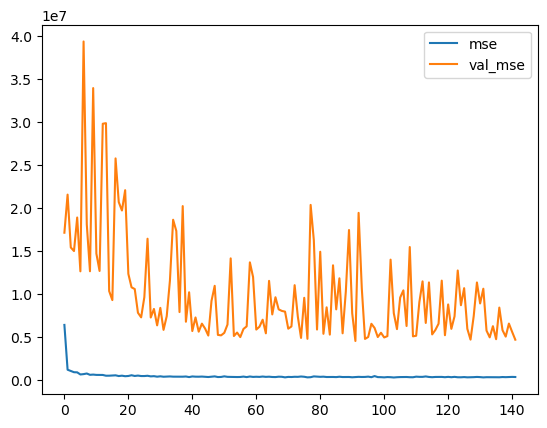

4/4 [==============================] - 0s 4ms/step


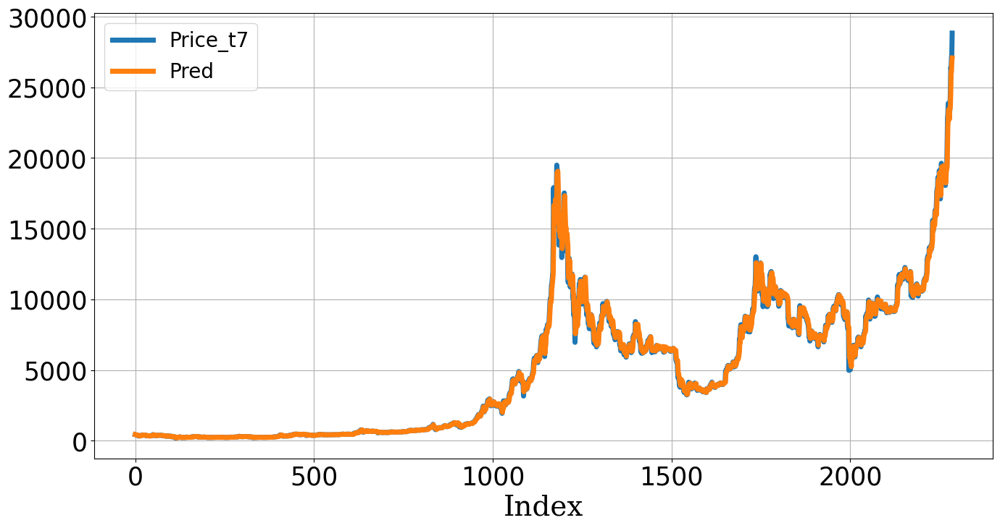

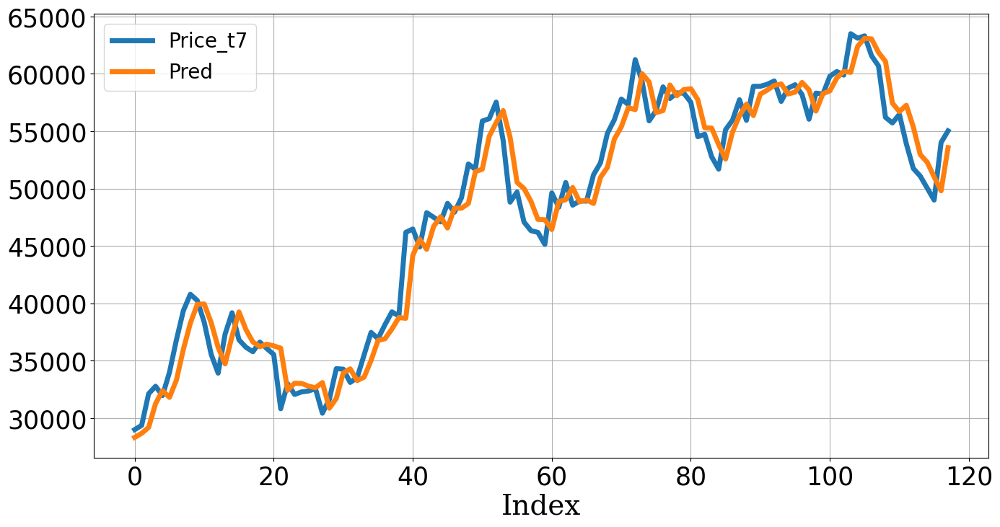

,MAE,MSE,MAPE
Train,148.40,"104,051.89",0.03
Test,"1,691.53","4,659,020.38",0.04


In [69]:
# 하이퍼파라미터


# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

# Reshape


# 네트워크 구축


## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

In [70]:
# 데이터 백업
X_trprep3D, X_teprep3D = X_train.copy(), X_test.copy()
Y_trprep3D, Y_teprep3D = Y_train.copy(), Y_test.copy()

4/4 [==============================] - 0s 4ms/step


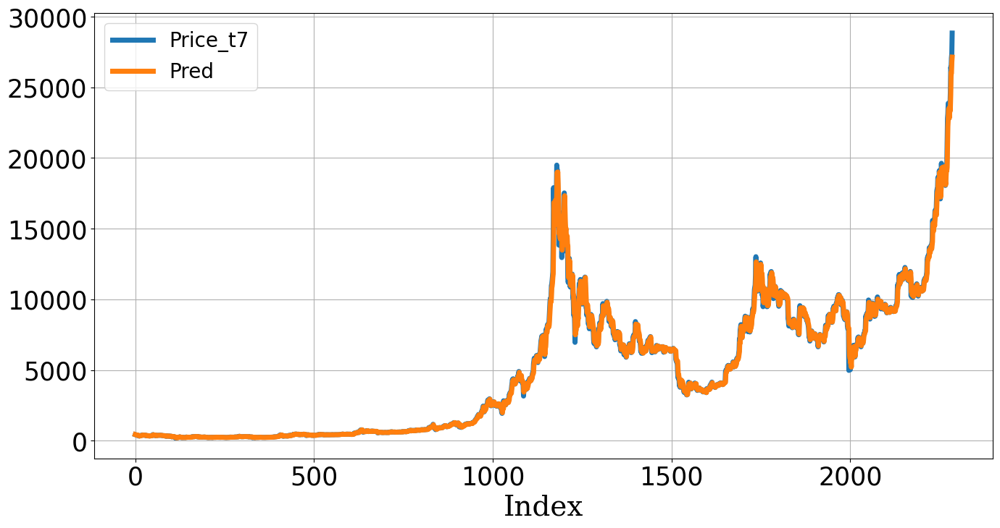

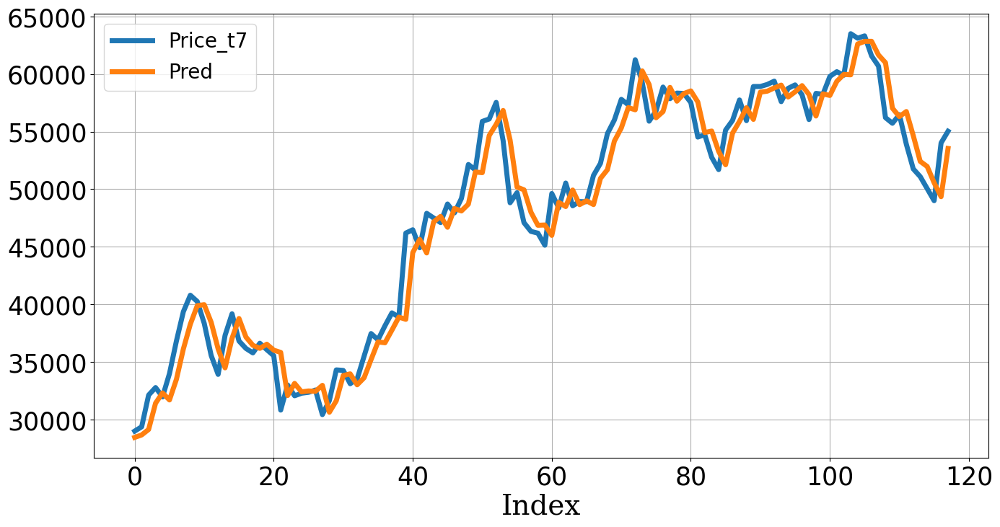

,MAE,MSE,MAPE
Train,145.03,"100,081.12",0.03
Test,"1,645.17","4,508,555.80",0.04


In [71]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## LSTM

<center><img src='Image/Expert/DL_RNN_Operation.PNG' width='700'>(http://colah.github.io/posts/2015-08-Understanding-LSTMs/)</center>

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)
X_train: (2286, 7, 1) Y_train: (2286, 1)
X_test: (118, 7, 1) Y_test: (118, 1)
Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 7, 1)]            0         
                                                                 
 lstm_4 (LSTM)               (None, 7, 128)            66560     
                                                                 
 dropout_32 (Dropout)        (None, 7, 128)            0         
                                                                 
 lstm_5 (LSTM)               (None, 7, 64)             49408     
                                                                 
 dropout_33 (Dropout)        (None, 7, 64)             0         
                                                                 
 flatten_10 (Flatten)        (None, 448) 

Training:   0%|                                                                                               …

Epoch 54: early stopping


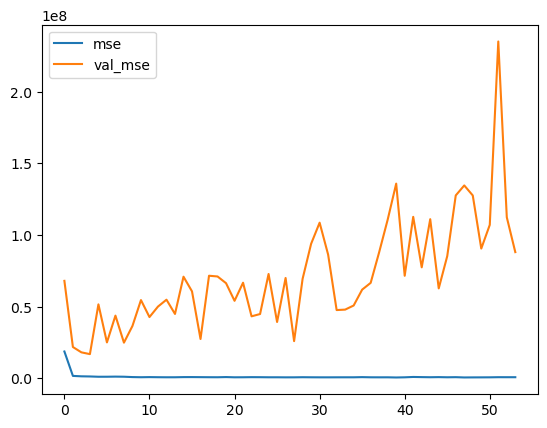

4/4 [==============================] - 0s 6ms/step


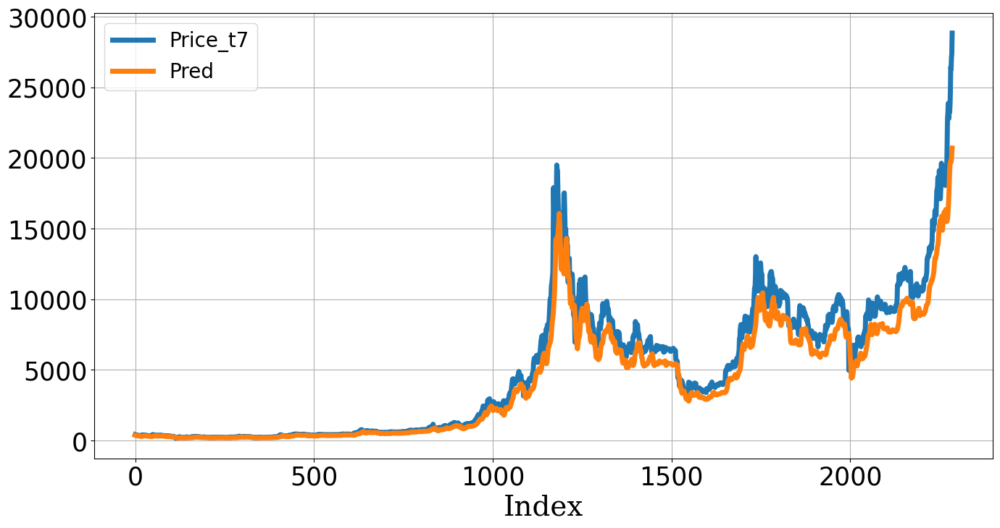

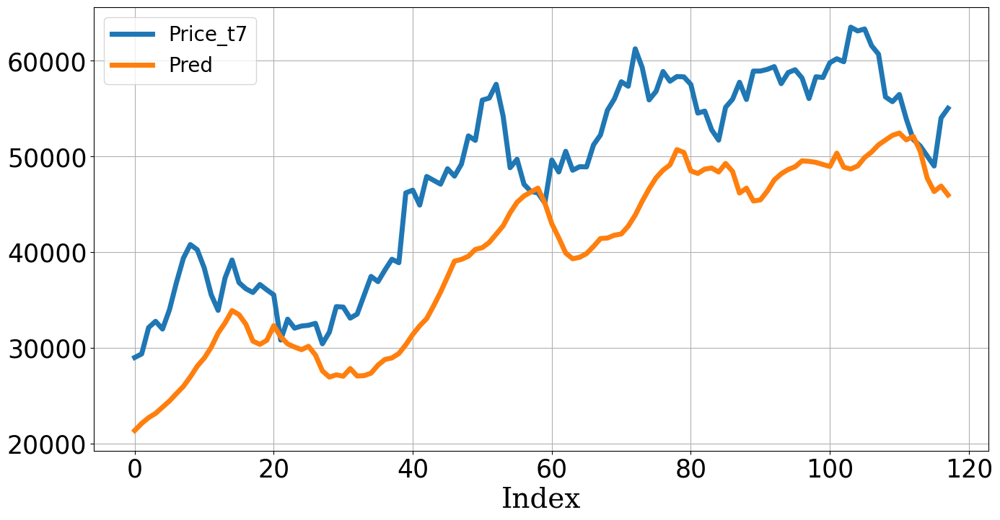

,MAE,MSE,MAPE
Train,839.25,"1,768,791.37",0.16
Test,"8,380.96","88,104,318.03",0.17


In [72]:
# 하이퍼파라미터


# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

# Reshape


# 네트워크 구축


## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

4/4 [==============================] - 0s 6ms/step


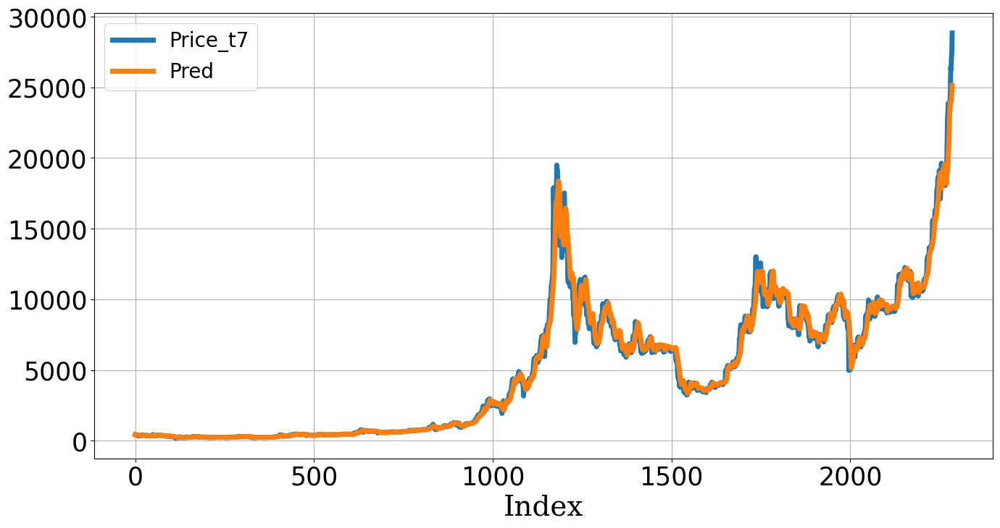

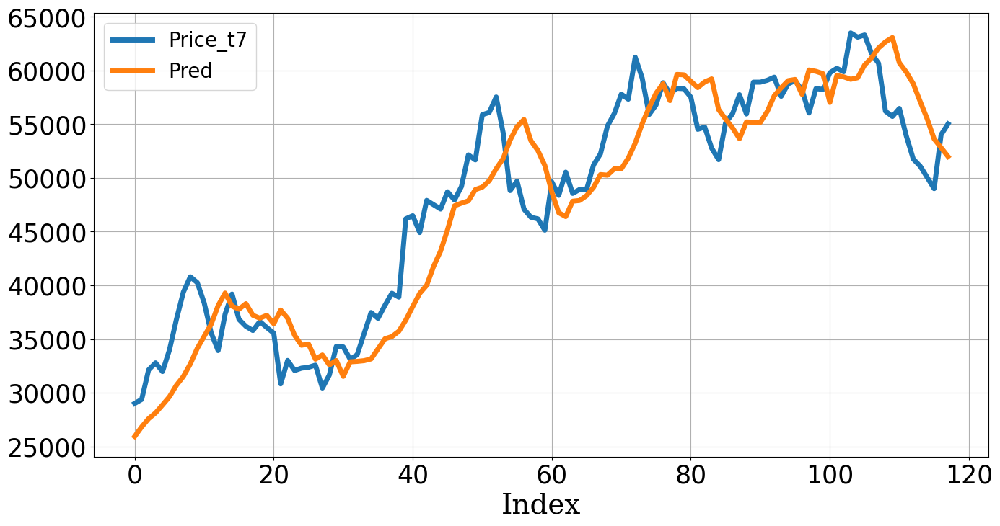

,MAE,MSE,MAPE
Train,299.11,"365,430.00",0.05
Test,"3,376.80","16,948,061.45",0.07


In [73]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## GRU

<center><img src='Image/Expert/DL_LSTM_GRU.png' width='700'>(https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21)</center>

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)
X_train: (2286, 7, 1) Y_train: (2286, 1)
X_test: (118, 7, 1) Y_test: (118, 1)
Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 7, 1)]            0         
                                                                 
 gru_4 (GRU)                 (None, 7, 128)            50304     
                                                                 
 dropout_34 (Dropout)        (None, 7, 128)            0         
                                                                 
 gru_5 (GRU)                 (None, 7, 64)             37248     
                                                                 
 dropout_35 (Dropout)        (None, 7, 64)             0         
                                                                 
 flatten_11 (Flatten)        (None, 448) 

Training:   0%|                                                                                               …

Epoch 108: early stopping


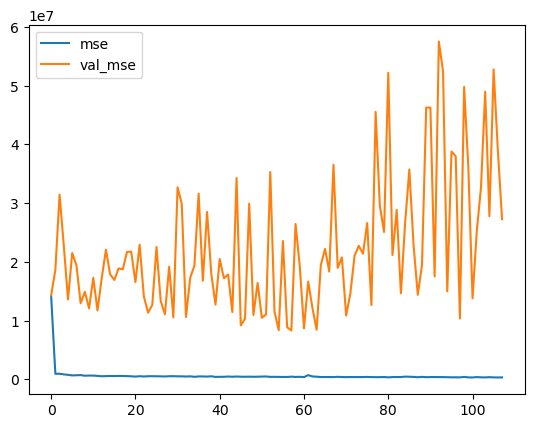

4/4 [==============================] - 0s 7ms/step


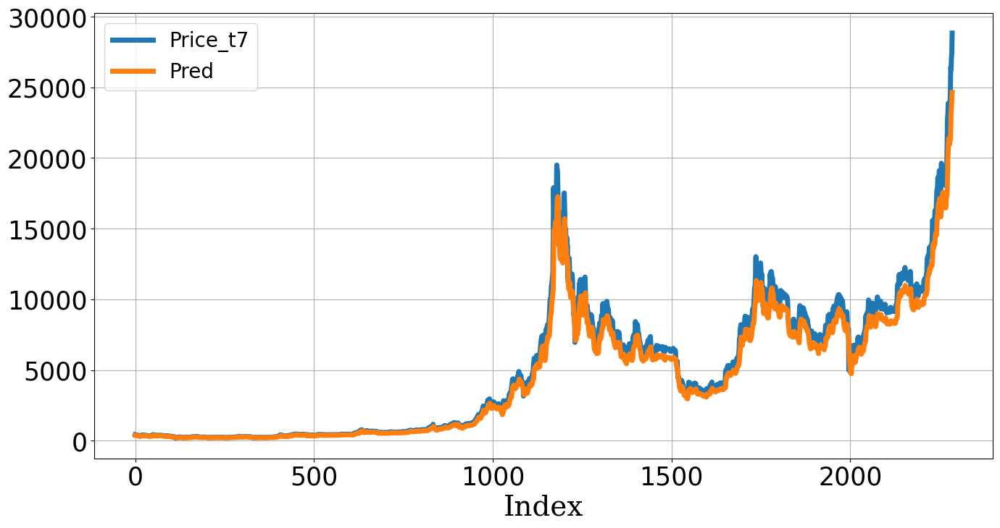

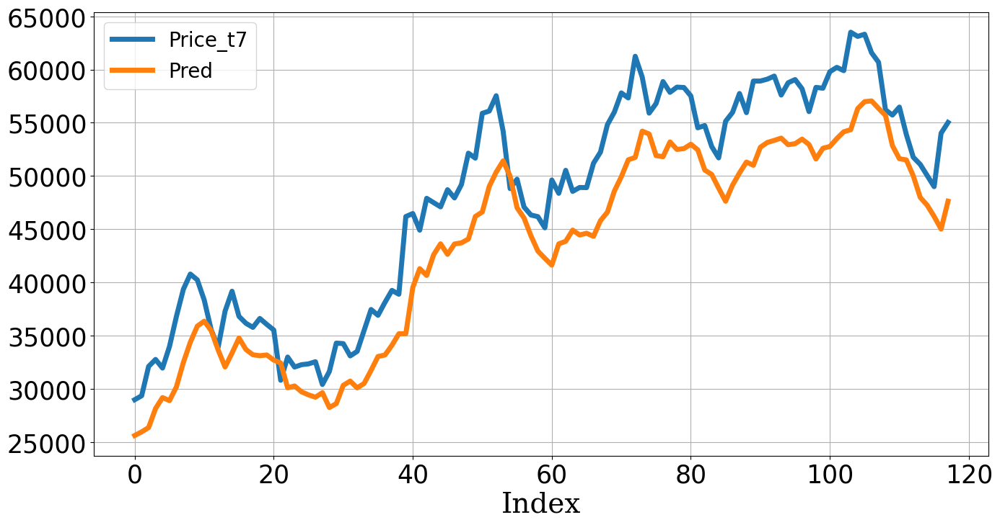

,MAE,MSE,MAPE
Train,479.72,"548,266.81",0.10
Test,"4,741.67","27,276,290.21",0.10


In [74]:
# 하이퍼파라미터


# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

# Reshape


# 네트워크 구축


## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

4/4 [==============================] - 0s 6ms/step


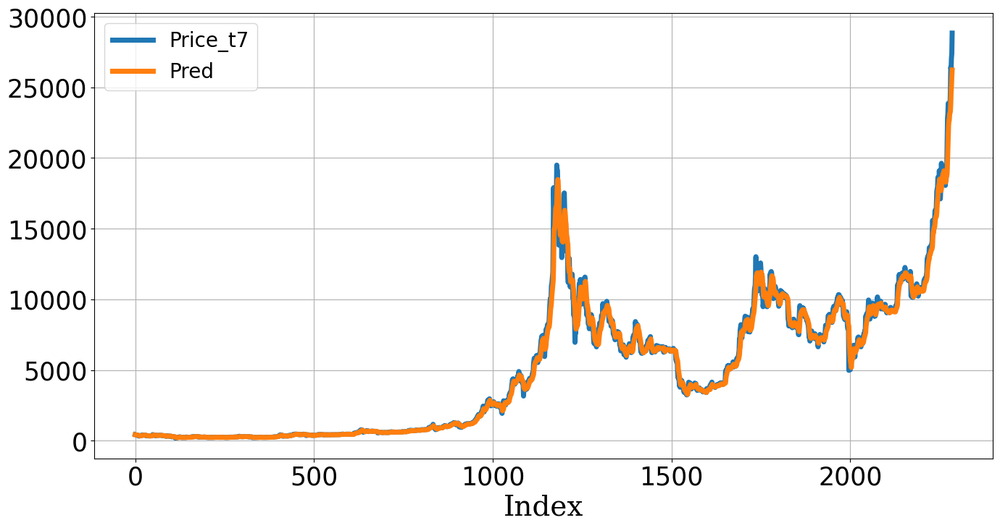

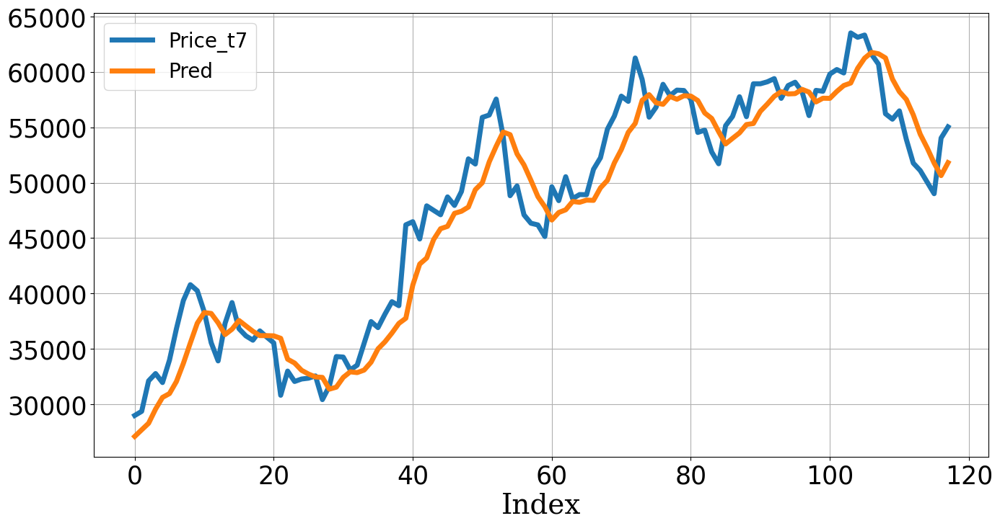

,MAE,MSE,MAPE
Train,205.87,"180,125.57",0.04
Test,"2,374.16","8,297,335.69",0.05


In [75]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Result Summary

MLP
4/4 [==============================] - 0s 2ms/step
CNN
4/4 [==============================] - 0s 6ms/step


,MAE,MSE,MAPE
MLP,"7,227.90","58,567,580.60",0.15
CNN,"1,969.35","6,041,656.56",0.04
RNN,"1,645.17","4,508,555.80",0.04
LSTM,"3,376.80","16,948,061.45",0.07
GRU,"2,374.16","8,297,335.69",0.05


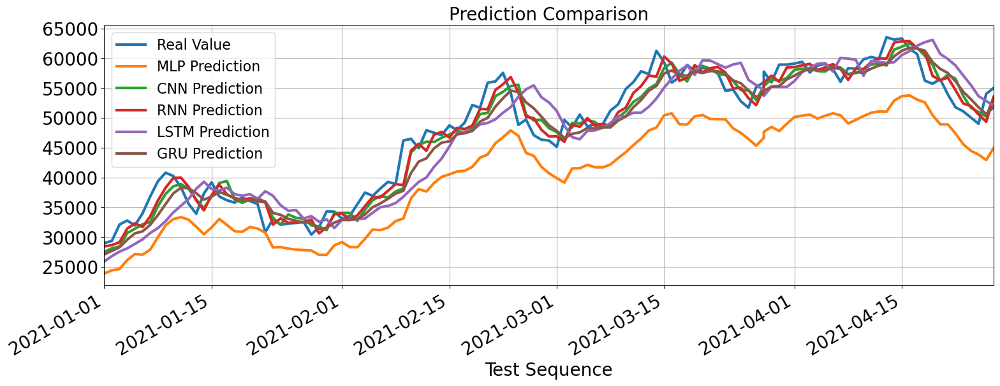

In [76]:
# 저장 모델 불러오기
modelnames = ['MLP', 'CNN', 'RNN', 'LSTM', 'GRU']

# 결과 정리
Y_pred, Score_final = Y_test.copy(), pd.DataFrame()
for each in modelnames:
    FILENAME = os.path.join(os.getcwd(),'Model','BitcoinPrice_'+each+'.h5')
    
    # 베스트 모델 로딩
    model = load_model(FILENAME)
    
    ## 예측하기
    if each in ['MLP', 'CNN']:
        print(each)
        Y_tepred = pd.DataFrame(model.predict(X_teprep2D), 
                                index=Y_teprep2D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg( Y_teprep2D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
    else:
        Y_tepred = pd.DataFrame(model.predict(X_teprep3D), 
                                index=Y_teprep3D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg(Y_teprep3D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
  
# 정리
Y_pred.columns = ['Real Value']+[i+' Prediction' for i in modelnames]
Score_final.index = modelnames
    
# 결과 출력
display(Score_final)
Y_pred.plot(kind='line', figsize=(18,6), linewidth=3, fontsize=20,
            xlim=(Y_pred.index.min(),Y_pred.index.max()))
plt.title('Prediction Comparison', fontsize=20)
plt.xlabel('Test Sequence', fontsize=20)
plt.ylabel('', fontsize=20)
plt.legend(fontsize=16)
plt.grid()
plt.show()

In [2]:
### 시작 및 본인정보 반영
# 반드시 이 cell을 실행하시오
# 실행하지 않을 시 직접 하지 않은 것으로 간주
# 마지막 줄 출력으로 파일명을 설정하고 제출 필수
import platform, psutil, os, datetime
print(platform.processor())
print(str(round(psutil.virtual_memory().total / (1024.0 **3)))+"(GB)")
print(platform.system())
print(platform.version())
print(os.getcwd())
print(datetime.datetime.fromtimestamp(os.path.getctime(os.getcwd())))
print(datetime.datetime.fromtimestamp(os.path.getmtime(os.getcwd())))
print(datetime.datetime.fromtimestamp(os.path.getatime(os.getcwd())))
print(datetime.datetime.now())
title = 'DL_RNNArchitectures'    # 고정값
name = '김경원'    # 본인 이름을 작성
studentid = '20211011'    # 본인 학번을 작성
# 아래 강좌 명 중 본인이 수강하는 강과명 작성
# 비즈니스데이터사이언스이해, 디지털비즈니스애널리틱스, 비즈니스수요예측, 인공지능기반의사결정, 빅데이터 등
# 비즈니스혁신을위한데이터사이언스응용, 인공지능활용디지털경제플랫폼연구 등
course = '비즈니스수요예측'    
print('다음 출력을 파일명으로 설정하고 제출하시오:', name + '_' + studentid + '_' + course + '_' + title)

Intel64 Family 6 Model 186 Stepping 2, GenuineIntel
32(GB)
Windows
10.0.26200
C:\DataScience\Lecture\[DataScience]
2024-12-12 00:34:16.155373
2025-11-13 15:08:50.214384
2025-11-13 15:08:50.214384
2025-11-13 15:09:00.940636
다음 출력을 파일명으로 설정하고 제출하시오: 김경원_20211011_비즈니스수요예측_DL_RNNArchitectures
